This notebook creates a dataset of train/test/val images **in a microfluidic environment** ie. with two lines and cells in the middle.

The folder paths and split percentages are within the file conf/config.yaml, loaded here:

In [3]:
from omegaconf import DictConfig, OmegaConf
from hydra import initialize, compose

with initialize(config_path="../conf", version_base="1.3"):
    cfg = compose(config_name="config_data_creation_microfluidic_device")
    print(OmegaConf.to_yaml(cfg))

paths:
  root_abs: /home/alex/dev/python/tx_rbc/tx_shared/
  data_from_notebooks: ../data/
  constructed_dataset: data/constructed_datasets/copy_paste_microfluidic
  constructed_dataset_randompos: data/constructed_datasets/copy_paste_random_pos
  constructed_dataset_test: data/constructed_datasets/copy_paste_microfluidic_test
  liang_2024_from_root: data/2024_liang
  kihm_2018_from_root: data/2018_plos
  nouaman_from_root: data/2024_nouaman
  nouaman_videos_from_root: data/videos/nouaman_2024
  naples_tif_stack: data/tomaiuolo_naples
dataset_distribution:
  train_liang: 10
  train_nouaman: 80
  train_kihm: 70
  test_liang: 90
  test_nouaman: 10
  test_kihm: 15
  val_liang: 0
  val_nouaman: 10
  val_kihm: 15
factors:
  noise_fn:
  - none
  - gaussian
  - salt_pepper
  - random
  croissant_count:
  - 1
  - 2
  slipper_count:
  - 1
  - 2
  object_count:
  - 1
  - 2
  lines:
  - true
  - false
  artifacts:
  - true
  - false
  channel_state:
  - lighten_channel
  - darken_channel
  - norma

In [2]:
import os
import cv2
import numpy as np
import json
from PIL.Image import open as PIL_Image_open, fromarray as PIL_Image_fromarray
from PIL.ImageFilter import GaussianBlur as PIL_ImageFilter_GaussianBlur
from matplotlib import pyplot as plt
import random
from noise import snoise2
from tqdm import tqdm
import shutil
import math

# Extract cells

## Load all cells (Liang et al. 2024, Kihm et al. 2018)

Saved images are already representing only the cell. Yet
it is known that the angles of the images aren't cell 
(= cell objects don't lie in the image corners).
So the cell's binary mask won't be a rectangle of ones,
but a rectangles with rounded edges.

In [5]:
def load_liang_2024(path_to_root):
    """
    Note: the returned object is : 
    { 
        '0': [(cell, mask), (cell, mask), ...
        '1': [(cell, mask), (cell, mask), ...
    }
    
    Parameters
    ----------
    path_to_root: str
        Path to folder containing test and 
        train subfolders, each containing
        the images in parachute and slipper folders.
    """
    cells = {'0': [], '1':[]}

    for split in ['train', 'test', 'val']:
        parachute_path = os.path.join(path_to_root, split, "parachute")
        slipper_path = os.path.join(path_to_root, split, "slipper")
        for cell_type, folder in [
            ('0', parachute_path), ('1', slipper_path)]:
            for iname in os.listdir(folder):
                cell = np.array(PIL_Image_open(os.path.join(folder, iname)))
                mask = cell > 0
    
                cells[cell_type].append((cell, mask))

    return cells

587 189


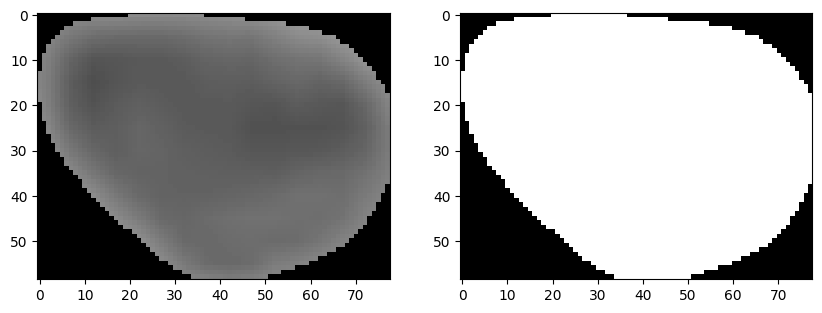

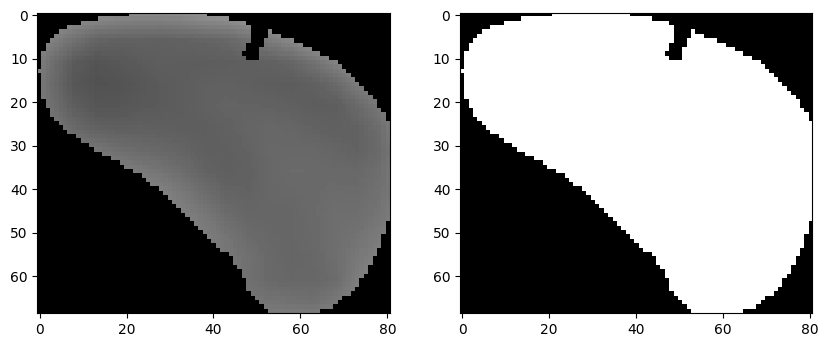

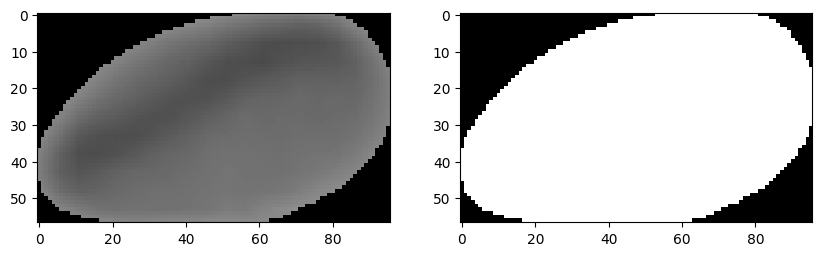

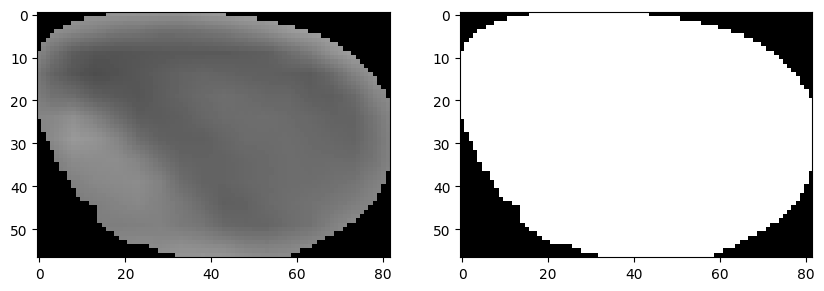

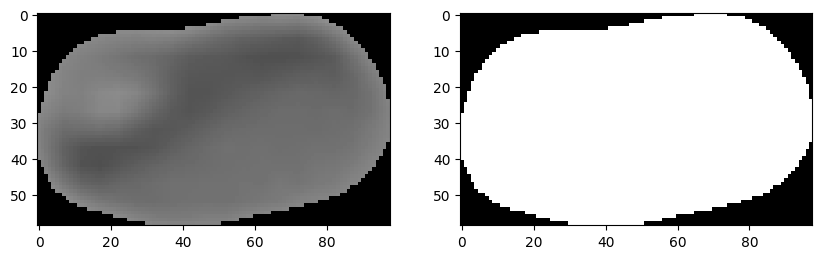

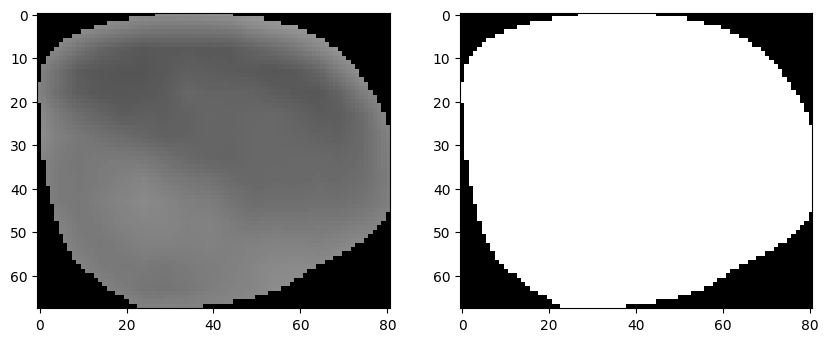

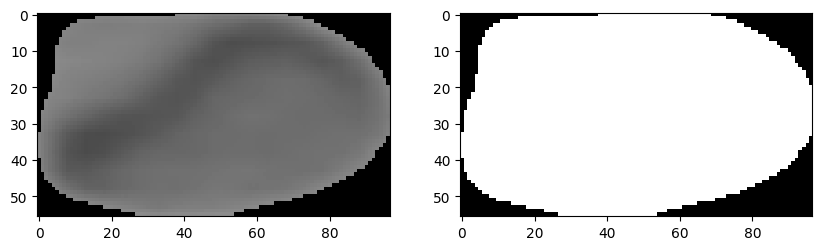

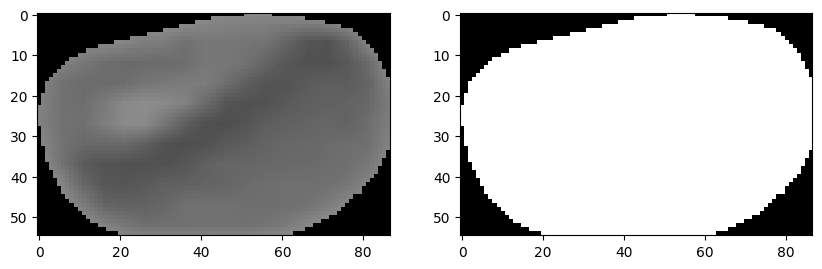

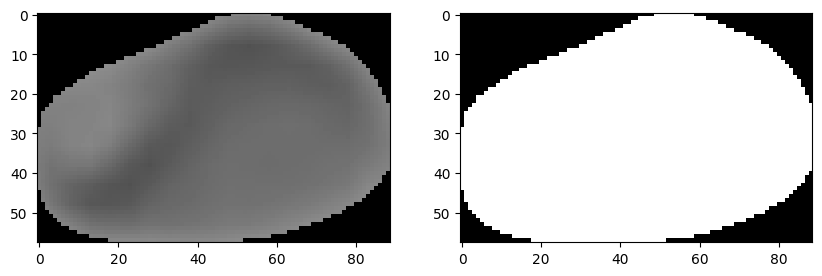

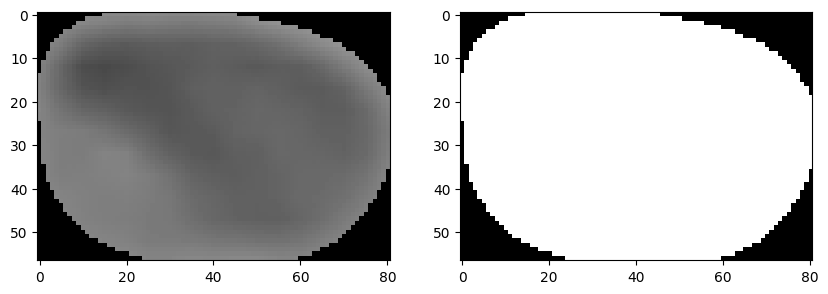

In [7]:
liang_cells = load_liang_2024(os.path.join(cfg.paths.root_abs, cfg.paths.liang_2024_from_root))
print(len(liang_cells['0']), len(liang_cells['1']))
for i in range(10):
    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    plt.imshow(liang_cells['1'][i][0], cmap='gray', vmin=0, vmax=255)
    plt.subplot(122)
    plt.imshow(liang_cells['1'][i][1], cmap='gray', vmin=0, vmax=1)
    plt.show()

## Load all cells (Nouaman et al. 2024)

Separate slippers from croissants using dict keys.

In [37]:
def load_nouaman():
    """
    Extracts all (cell, mask) from JSON annotation file and 
    returns a dict of (cell, mask) by category (int as str):
    
    Note: the returned object is : 
    { 
        '0': [(cell, mask), (cell, mask), ...
        '1': [(cell, mask), (cell, mask), ...
    }

    Returns
    -------
    cells: dict
        keys are '0', '1' (croissants, slippers)
        values are list of cell images for each category 
    """

    # ========================= Nouaman 2024 ==================
    path_to_nouaman = os.path.join(cfg.paths.root_abs, cfg.paths.nouaman_from_root)
   
    cells = {'0': [], '1':[]}
    
    parachute_path = os.path.join(path_to_nouaman, "croissant")
    slipper_path = os.path.join(path_to_nouaman, "slipper")
    for cell_type, folder in [
        ('0', parachute_path), ('1', slipper_path)]:
        for iname in os.listdir(folder):
            cell = np.array(PIL_Image_open(os.path.join(folder, iname)))
            mask = cell > 0

            cells[cell_type].append((cell, mask))

    return cells

## 🔥 splits creation

Split distribution is in the config file.

New way of making the splits: 

For each dataset, take all its parachute and all its slippers, and make a dataframe out of this: 

|label '0'|label '1'|
|--|--|
|parachute 1|slipper 1|
|parachute 2|slippers 2|
|...|...|

Then: 
- take 10% of liang and place it in train set, other 10% in val, 80% in test
- take 70% of Kihm, and place it in train set, other 10% in val, ...
- ... *all numbers are in the config file*

This creates three final datasets (train, val, test)

In [38]:
import pandas as pd 
import random
from typing import Dict, List, Tuple

def split_dataset_dict(
    dataset: Dict[str, List[str]],
    train_frac: float,
    val_frac: float,
    test_frac: float,
    seed: int = 42
) -> Tuple[Dict[str,List[str]], Dict[str,List[str]], Dict[str,List[str]]]:
    """
    Splits one dataset (mapping label → list of images)
    into (train_dict, val_dict, test_dict), each the same dict structure.
    """
    random.seed(seed)
    train_dict = {}
    val_dict   = {}
    test_dict  = {}
    
    for label, img_list in dataset.items():
        # shuffle in place
        imgs = list(img_list[img_list.isna() == False].copy())
        random.shuffle(imgs)
        
        n_total = len(imgs)
        n_train = int(train_frac * n_total)
        n_val   = int(val_frac   * n_total)
        # ensure all remaining go to test:
        n_test  = n_total - n_train - n_val
        
        train_dict[label] = imgs[:n_train]
        val_dict[label]   = imgs[n_train:n_train + n_val]
        test_dict[label]  = imgs[n_train + n_val:]
    
    return train_dict, val_dict, test_dict


def pad_dict_columns(data_dict):
    max_len = max(len(v) for v in data_dict.values())
    return {k: v + [None] * (max_len - len(v)) for k, v in data_dict.items()}

def load_dataset_with_splits():

    # ======================== Nouaman 2024 ====================
    nouaman_cells = load_nouaman()
    
    # ======================== Liang 2024 ====================
    liang_cells = load_liang_2024(os.path.join(cfg.paths.root_abs, cfg.paths.liang_2024_from_root))
    
            
    # ======================== Kihm 2018 ====================
    # Same load function can be used as same extraction+saving process
    kihm_cells = load_liang_2024(os.path.join(cfg.paths.root_abs, cfg.paths.kihm_2018_from_root))


    df_nouaman = pd.DataFrame(pad_dict_columns(nouaman_cells))
    print('\n\n=== Nouman ===')
    print(df_nouaman.count())
    print("\nnan count:\n", df_nouaman.isna().sum())
    
    
    df_liang = pd.DataFrame(pad_dict_columns(liang_cells))
    print('\n\n=== Liang ===')
    print(df_liang.count())
    print("\nnan count:\n", df_liang.isna().sum())
    
    
    
    df_kihm = pd.DataFrame(pad_dict_columns(kihm_cells))
    print('\n\n=== Kihm ===')
    print(df_kihm.count())
    print("\nnan count:\n", df_kihm.isna().sum())
    
    datasets = {1: df_nouaman, 2: df_liang, 3: df_kihm}
    all_splits = {
        'train': {'0': [], '1': []},
        'val':   {'0': [], '1': []},
        'test':  {'0': [], '1': []},
    }

    # For each dataset, fraction of train, val, test
    fractions = {
        1: (cfg.dataset_distribution.train_nouaman, cfg.dataset_distribution.val_nouaman, cfg.dataset_distribution.test_nouaman),
        2: (cfg.dataset_distribution.train_liang, cfg.dataset_distribution.val_liang, cfg.dataset_distribution.test_liang),
        3: (cfg.dataset_distribution.train_kihm, cfg.dataset_distribution.val_kihm, cfg.dataset_distribution.test_kihm)
    }
    
    for idx, ds in datasets.items():
        t_frac, v_frac, e_frac = fractions[idx]
        tr, va, te = split_dataset_dict(ds, t_frac/100, v_frac/100, e_frac/100, seed=42)
    
        # accumulate across datasets
        for lbl in ['0','1']:
            all_splits['train'][lbl].extend(tr[lbl])
            all_splits['val'][lbl].extend(va[lbl])
            all_splits['test'][lbl].extend(te[lbl])

    return all_splits


In [39]:
all_splits = load_dataset_with_splits()

    
for key, value in all_splits.items():
    print(key)
    for label in value:
        print(f'     {label}: {len(value[label])}')



=== Nouman ===
0     204
1    1492
dtype: int64

nan count:
 0    1288
1       0
dtype: int64


=== Liang ===
0    587
1    189
dtype: int64

nan count:
 0      0
1    398
dtype: int64


=== Kihm ===
0    2492
1    2992
dtype: int64

nan count:
 0    500
1      0
dtype: int64
train
     0: 1965
     1: 3305
val
     0: 393
     1: 597
test
     0: 925
     1: 771


## Change color of cell

Nouaman's cells (as PLOS) are shiny on the edges. The following function aims to diversify the set of cells by changing their color, whether by changing their initial color or by setting the whole cell to a specific color (last shouldn't be used anymore and use (Lian et al., 2024) instead).

In [8]:
def pick_color_excluding(base_color, low=85, high=140, min_difference=25):
    valid_colors = list(range(low, max(low, base_color - min_difference))) + \
                   list(range(min(high, base_color + min_difference + 1), high + 1))
    return random.choice(valid_colors)


def change_color(cell, mask, background_base_color=None):
    """
    Parameters
    ----------
    cell: np.ndarray (float 0 to 255)
        Cell object on black canvas. Shape is (h, w), 
        no alpha channel.

    mask: np.ndarray
        Binary mask of shape (h, w) of the cell.

    background_base_color: int
        Color of the base background use in background generation.
        If provided and in if fixed mode, it will be used to verify 
        that the cell doesn't have the same color, which will cause 
        semi-invisibility.

    Return
    ------
    cell: np.ndarray (float 0 to 255)
        Modified cell
    """

    mask = np.array(mask, dtype=bool)

    cell = cell.astype(np.uint16) # for values > 255, which will be clipped before return
    cell_recolored = np.zeros_like(cell)

    delta_range = (-40, 40)
    cell_mean_color = np.mean(cell[mask], axis=0)
    min_distance = 30
    valid_deltas = []
    for delta in range(delta_range[0], delta_range[1] + 1):
        test_color = np.clip(np.array(cell_mean_color) + delta, 0, 255)
        dist = np.linalg.norm(test_color - background_base_color)
        if dist >= min_distance:
            valid_deltas.append(delta) 
        
    color_delta = random.choice(valid_deltas)
    cell_recolored[mask] = np.clip(cell[mask] + color_delta, 0, 255)

    return cell_recolored.astype(np.uint8)

Example:

Category 0:


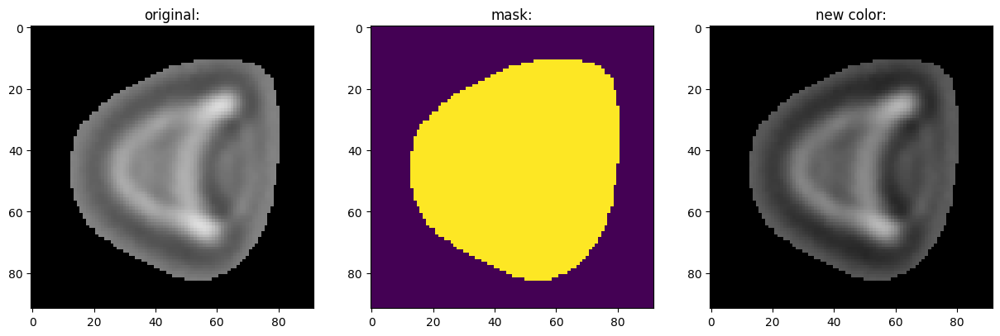

Category 1:


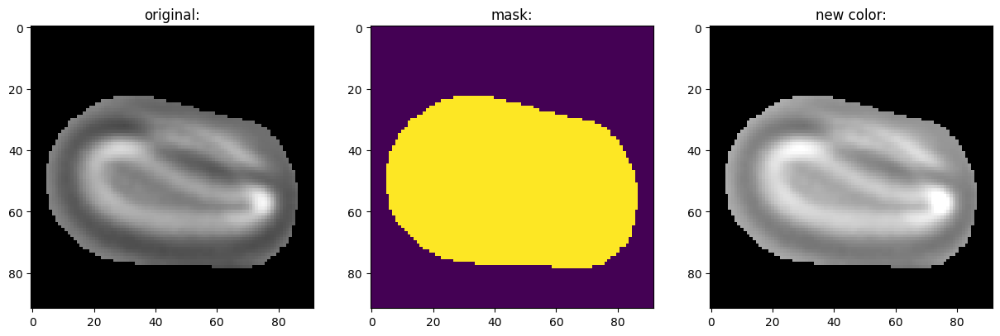

In [16]:
cells = load_cells_by_category()#os.path.join(cfg.paths.data_from_notebooks, 'saarland', 'annotations', 'result.json'))

for key in cells.keys():
    cell, mask = random.choice(cells[key])
    print(f'Category {key}:')
    #fig, ax = plt.subplot()
    plt.figure(figsize=(15, 5))
    plt.subplot(131)
    plt.title('original:')
    plt.imshow(cell, cmap='gray', vmin=0, vmax=255)
    plt.subplot(132)
    plt.title('mask:')
    plt.imshow(mask, vmin=0, vmax=1)
    plt.subplot(133)
    plt.title('new color:')
    plt.imshow(change_color(cell, mask, 120), cmap='gray', vmin=0, vmax=255)
    #plt.colorbar()
    plt.show();

# Background creation 
(same as in `synthetic_data_creation.ipynb`)

In [9]:
def generate_noise_background(width, height, base_image = None):
    # Step 1: Random base background color
    if base_image is None:
        base_color = random.randint(100, 150)
        base_image = np.full((height, width), base_color, dtype=np.float32)
    else:
        base_color = np.mean(base_image)

    # Step 2: Add first Simplex noise with random zoom level
    zoom1 = random.uniform(0.5, 2.0)
    noise1 = np.array([[snoise2(x / zoom1, y / zoom1) for x in range(width)] for y in range(height)])
    noise1 = (noise1 - noise1.min()) / (noise1.max() - noise1.min())  # Normalize to (0,1)
    noise_force1 = random.uniform(0.5, 2.0)
    base_image += noise1 * noise_force1

    # Step 3: Apply Gaussian blur with a random radius
    img =PIL_Image_fromarray(np.uint8(base_image))
    blur_radius = random.uniform(1.0, 3.0)
    img = img.filter(PIL_ImageFilter_GaussianBlur(radius=blur_radius))

    # Step 4: Add second Simplex noise with randomized intensity
    zoom2 = random.uniform(0.5, 3.0)
    noise2 = np.array([[snoise2(x / zoom2, y / zoom2) for x in range(width)] for y in range(height)])
    noise_force2 = random.uniform(-20, 20)
    noise2 = noise2 * noise_force2  # Random scale range
    img_array = np.array(img, dtype=np.float32) + noise2

    # Step 5: Add third Simplex noise with a different zoom and intensity
    zoom3 = random.uniform(0.005, 0.02)
    noise3 = np.array([[snoise2(x * zoom3, y * zoom3) for x in range(width)] for y in range(height)])
    noise_force3 = random.uniform(-10, 10)
    noise3 = noise3 * noise_force3
    img_array += noise3

    # Clip and convert back to image
    img_array = np.clip(img_array, 0, 255).astype(np.uint8)
    final_image = img_array#PIL_Image_fromarray(img_array)

    return final_image, {
        'base_color': base_color,
        'zoom1': zoom1,
        'noise_force1': noise_force1,
        'zoom2': zoom2,
        'noise_force2': noise_force2,
        'zoom3': zoom3,
        'noise_force3': noise_force3,
        'blur_radius': blur_radius
    }

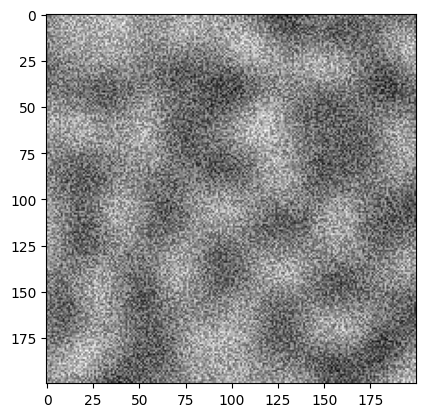

In [18]:
plt.imshow(generate_noise_background(200, 200)[0], cmap='gray')

# Add walls and lines to background

Goal: 
- add a line to some of the images, representing the microfluidic device that can be seen on many images.
- add thin hair-like line to perturbate the model and complexify the images

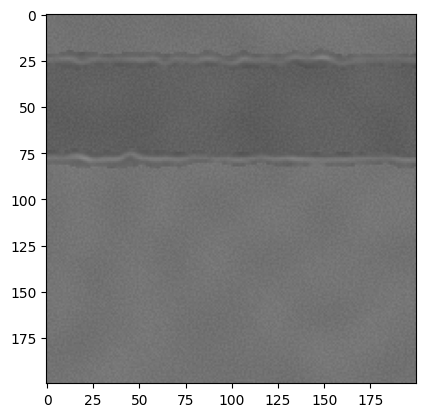

In [10]:
from scipy.ndimage import gaussian_filter as scipy_ndimage_gaussian_filter, \
                        map_coordinates as scipy_ndimage_map_coordinates
from random import randint as rdm_range

def elastic_transform(image, alpha, sigma, random_state=None):
    """Apply elastic deformation on an image."""
    if random_state is None:
        random_state = np.random.RandomState(None)
    shape = image.shape[:2]

    # generate random displacement fields
    dx = scipy_ndimage_gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma, mode="constant") * alpha
    dy = scipy_ndimage_gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma, mode="constant") * alpha

    # meshgrid coordinates
    x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
    indices = np.reshape(y + dy, (-1, 1)), np.reshape(x + dx, (-1, 1))

    # map coordinates with linear interpolation
    distorted = scipy_ndimage_map_coordinates(image, indices, order=1, mode='reflect').reshape(shape)
    return distorted

def add_walls(image:np.ndarray, params:dict):
    """
    Goal: add a line to some of the images, representing the 
    microfluidic device that can be seen on many images.
    Otherwise, the model sees microfluidic devices as slippers (tested).
    Based on https://doi.org/10.1016/j.isci.2023.108542 in sup. materials.
    """

    bg_base_color = np.mean(image)
    h, w = image.shape[0] - 1, image.shape[1] - 1
    image_walls = np.zeros_like(image)

    # Three lines with different colors & thickness are created
    line1_color = random.randint(int(bg_base_color)-80, int(bg_base_color)-30)
    line1_color = max(line1_color, 0)
    line2_color = random.random() * 15 + bg_base_color #(0, 15) # avoid 0 as it is used for mask
    line3_color = random.randint(200, 255)
    line1_thickness = random.randint(3, 4)
    line2_thickness = random.randint(4, 5)
    line3_thickness = 1#random.randint(1, 2)
    
    # Idea: create a horizontal line, then add another below it
    inner_line_space = random.randint(cfg.parameters.inner_line_space[0], cfg.parameters.inner_line_space[1])
    y = random.randint(line2_thickness, h-inner_line_space-line2_thickness)

    for idx, (color, thickness) in enumerate([
        (line2_color, line2_thickness),
        (line1_color, line1_thickness),
        (line3_color, line3_thickness)
    ]):
        image_walls = cv2.line(image_walls, (0, y),(w, y),color, thickness)
        image_walls = cv2.line(image_walls, (0, y+inner_line_space),(w, y+inner_line_space),color, thickness)

    if 'channel_state' in params: # darken or lighten the channel
        if params['channel_state'] == 'lighten_channel':
            lit_value = 20
            image[y:y+inner_line_space,:] += lit_value
            image = np.clip(image, 0, 255)
        elif  params['channel_state'] == 'darken_channel':
            darkening_value = 20
            image[y:y+inner_line_space,:] -= darkening_value
            image = np.clip(image, 0, 255)
    
    # Elastic deformation
    image_walls = elastic_transform(image_walls, 15, 3)

    # Blur & paste on original image
    walls_mask = image_walls > 0
    image_walls[image_walls == 0] = bg_base_color    
    image_walls = cv2.GaussianBlur(image_walls, (5, 5), 0)
    image_walls = image_walls.astype(np.float32)

    # Step 2: Add first Simplex noise with random zoom level
    zoom1 = params['zoom1']
    noise1 = np.array([[snoise2(x / zoom1, y / zoom1) for x in range(w+1)] for y in range(h+1)])
    noise1 = (noise1 - noise1.min()) / (noise1.max() - noise1.min())  # Normalize to (0,1)
    noise_image = noise1 * params['noise_force1'] 
    image_walls += noise_image * walls_mask

    # Step 3: Apply Gaussian blur with a random radius
    img =PIL_Image_fromarray(np.uint8(image_walls))
    blur_radius = params['blur_radius']
    img = img.filter(PIL_ImageFilter_GaussianBlur(radius=blur_radius))

    # Step 4: Add second Simplex noise with randomized intensity
    zoom2 = params['zoom2']
    noise2 = np.array([[snoise2(x / zoom2, y / zoom2) for x in range(w+1)] for y in range(h+1)])
    noise_force2 = params['noise_force2']
    noise2 = noise2 * noise_force2  # Random scale range
    img_array = (np.array(img, dtype=np.float32) + noise2)*walls_mask

    # Step 5: Add third Simplex noise with a different zoom and intensity
    zoom3 = params['zoom3']
    noise3 = np.array([[snoise2(x * zoom3, y * zoom3) for x in range(w+1)] for y in range(h+1)])
    noise3 = noise3 * params['noise_force3']
    img_array += noise3 * walls_mask

    # Dilate mask
    kernel_size = (1, 1)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)
    mask_eroded = cv2.erode(walls_mask.astype(np.uint8) * 255 , kernel, iterations=2)    
    
    # Blur to get soft alpha
    alpha = cv2.GaussianBlur(mask_eroded.astype(np.float32)/255.0, (31,31), 0)
    alpha[walls_mask == 0] = 0.0 # clamp it – force α=0 outside the original mask
    image_walls = image_walls.astype(np.float32)/255.0 # ensure all arrays are float32 
    
    image   = image.astype(np.float32)/255.0    
    out = alpha * image_walls + (1 - alpha) * image # blend cell in background
    image = (out * 255).astype(np.uint8)

    return  image, {'inner_line_space':inner_line_space, "y_top": y, "y_bottom": y+inner_line_space}

bg, params = generate_noise_background(200, 200)
params['channel_state'] = 'darken_channel'
plt.imshow(add_walls(bg, params)[0], cmap='gray', vmin=0, vmax=255)

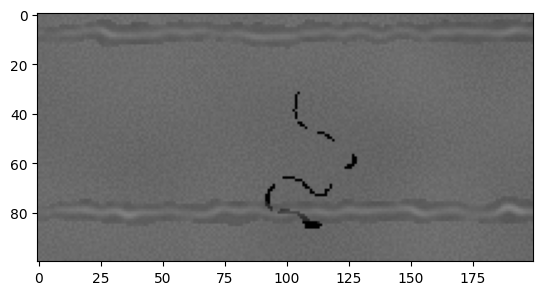

In [26]:
def add_elastic_line(base_img: np.ndarray,
                     alpha: float = 500,
                     sigma: float = 6) -> np.ndarray:
    """
    Goal: add a thin hai-like lines to some of the images.
    Based on https://doi.org/10.1016/j.isci.2023.108542 in sup. materials.

    Parameters:
        base_img: Grayscale image (H x W) as np.ndarray.
        elastic_transform: Function(image, alpha, sigma) -> distorted image.
        alpha: Elastic deformation strength.
        sigma: Elastic deformation smoothness.

    Returns:
        Modified image with the deformed line artifact.
    """
    h, w = base_img.shape

    # Sample random line parameters
    length = rdm_range(10, 100)
    thickness = rdm_range(1, 3)

    # Create a square canvas to draw the line
    size = max(length, thickness) + 10  # padding to avoid cropping when rotating
    canvas = np.full((size, size), 255, dtype=np.uint8)  # white background

    # Draw a horizontal black line in center
    start_pt = ((size - length) // 2, size // 2)
    end_pt = (start_pt[0] + length, size // 2)
    cv2.line(canvas, start_pt, end_pt, color=0, thickness=thickness)

    # Apply elastic deformation
    warped = elastic_transform(canvas, alpha, sigma)

    # Random rotation
    angle = random.uniform(0, 360)
    M = cv2.getRotationMatrix2D((size/2, size/2), angle, 1.0)
    rotated = cv2.warpAffine(warped, M, (size, size), borderValue=255)

    # Compute mask of line pixels
    mask = rotated < 128  # boolean mask where line is present

    # Choose random top-left position in base image
    max_x = w - size
    max_y = h - size
    if max_x <= 0 or max_y <= 0:
        # Base image too small to place artifact
        return base_img

    x = random.randint(0, max_x)
    y = random.randint(0, max_y)

    # Overlay the line: set those pixels to black (0)
    result = base_img.copy()
    roi = result[y:y+size, x:x+size]
    roi[mask] = 0
    result[y:y+size, x:x+size] = roi

    return result

img, prms = generate_noise_background(200, 100)
img = add_walls(add_elastic_line(img), prms)[0]
plt.imshow(img, cmap='gray', vmin=0, vmax=255)

# Noise functions

Implement different noise methods :
- gaussian noise with custom mean and std (default 0, 0.1)
- [salt and pepper noise](https://www.sciencedirect.com/science/article/pii/B9780121197926500875)
- random noise (uniform 0.3)

In [27]:
def add_gaussian_noise(image, mean=0, std=.035):
    """
    Parameters
    ----------
    image: ndarray
        Pixels range [0, 1]

    Returns
    -------
    noisy image: ndarray
        Pixels range [0, 1]
    """
    # Generate Gaussian noise
    noise = np.random.normal(mean, std, image.shape)  # Generate noise
    
    # Add noise to image
    noisy_image = image + noise
    
    # Clip values to stay in range [0,1]
    noisy_image = np.clip(noisy_image, 0, 1)
    
    return noisy_image

def add_salt_pepper_noise(image, prob = 0.02):
    """
    Parameters
    ----------
    image: ndarray
        Pixels range [0, 1]

    Returns
    -------
    noisy image: ndarray
        Pixels range [0, 1]
    """
    # Probability of noise
    noisy_image = image.copy()
    salt_pepper = np.random.rand(*image.shape[:2])
    
    noisy_image[salt_pepper < (prob / 2)] = 0  # Black pixels
    noisy_image[salt_pepper > 1 - (prob / 2)] = 1  # White pixels
    return noisy_image


def add_random_noise(image):
    """
    Parameters
    ----------
    image: ndarray
        Pixels range [0, 1]

    Returns
    -------
    noisy image: ndarray
        Pixels range [0, 1]
    """
    noise = np.random.uniform(0, .3, image.shape).astype(np.float32)
    noisy_image = cv2.addWeighted(image,0.65,noise,0.35,0)
    return noisy_image

### Demo of noise

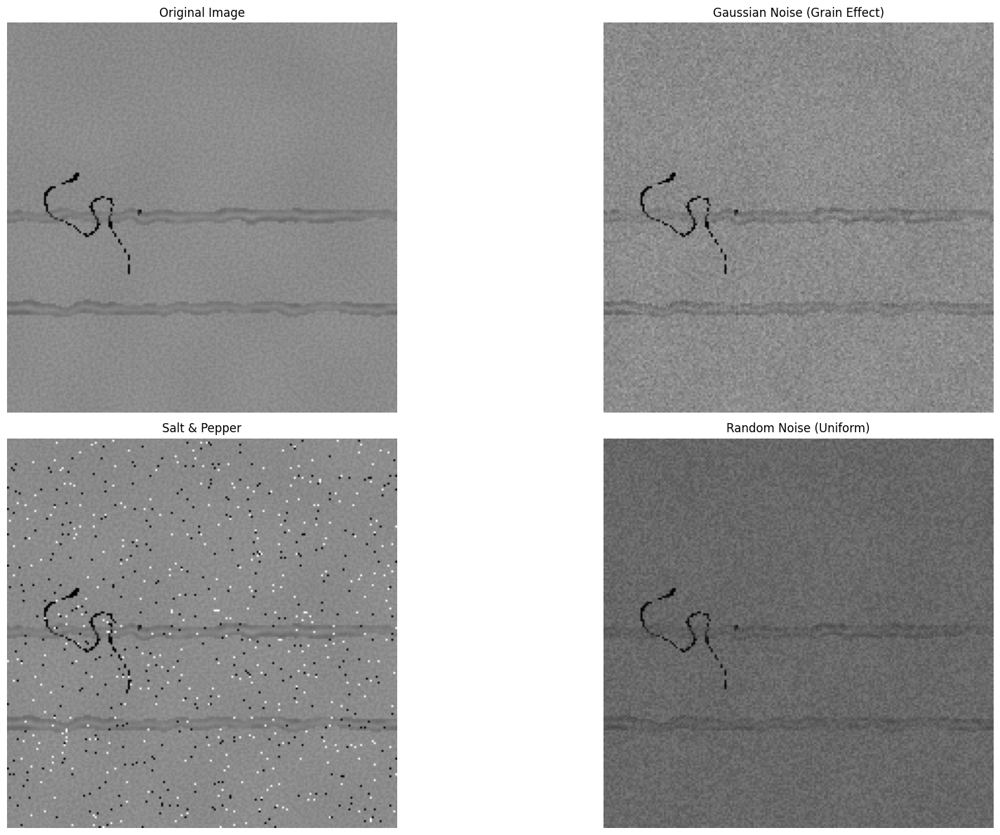

In [311]:
# Used with `img` from Background demo images step by step

noisy_image = add_gaussian_noise(img.astype(np.float32)/255)

# Display images
fig = plt.figure(figsize=(20,12))
fig.tight_layout()
plt.subplot(2,2,1)
plt.imshow(img, cmap='gray', vmin=0, vmax=255)
plt.title('Original Image')
plt.axis('off')

plt.subplot(2,2,2)
plt.imshow(noisy_image, cmap='gray', vmin=0, vmax=1)
plt.title('Gaussian Noise (Grain Effect)')
plt.axis('off')

plt.subplot(2,2, 3)
plt.imshow(add_salt_pepper_noise(img.astype(np.float32)/255), cmap='gray', vmin=0, vmax=1)
plt.title('Salt & Pepper')
plt.axis('off')

plt.subplot(2, 2,4)
plt.imshow(add_random_noise(img.astype(np.float32)/255.0), cmap='gray', vmin=0, vmax=1)
plt.title('Random Noise (Uniform)')
plt.axis('off')

plt.tight_layout()
#plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
plt.show()


# Overlay extracted cell on background

Required functions:

In [1]:
def find_bounding_box(arr):
    """
    Finds the bounding box of the nonzero region in a binary or grayscale array.

    Returns:
    --------
    tuple: (x_min, y_min, x_max, y_max)
        The bounding box.
    """
    rows = np.any(arr, axis=1)
    cols = np.any(arr, axis=0)

    rmin, rmax = np.where(rows)[0][[0, -1]] # Finds the minx/max rows
    cmin, cmax = np.where(cols)[0][[0, -1]] # Finds the min/max columns

    #return rmin, rmax+1, cmin, cmax+1  # +1 to include the max index
    return cmin, rmin, cmax+1, rmax+1  # +1 to include the max index

def random_displace(arr, rotation_angle=180):
    """
    Randomly displaces an object in a 2D numpy array.

    Notes on following Python code:
    'r' variables: row
    'c' variables: column

    Parameters
    ----------
    arr: np.array
        Array representing the cell, with black background,
        and non-black pixels for the cell.

    Returns
    -------
    new_arr: np.array
        Same shape as arr, yet with the content of the input
        being randomly placed elsewhere.
    """

    # Find bounding box
    cmin, rmin, cmax, rmax = find_bounding_box(arr)

    # Extract the object
    obj = arr[rmin:rmax, cmin:cmax]

    # Determine new random position (top-left point of cell)
    max_r = arr.shape[0] - (rmax - rmin)
    max_c = arr.shape[1] - (cmax - cmin)
    new_rmin = np.random.randint(0, max_r) if max_r > 0 else 0
    new_cmin = np.random.randint(0, max_c) if max_c > 0 else 0

    # Create new empty array
    new_arr = np.zeros_like(arr)

    # Determine final placement (bottom-right point of cell)
    new_rmax = min(new_rmin + (rmax - rmin), arr.shape[0])
    new_cmax = min(new_cmin + (cmax - cmin), arr.shape[1])

    # Place object in new location (cropping if necessary)
    new_arr[new_rmin:new_rmax, new_cmin:new_cmax] = obj[:new_rmax - new_rmin, :new_cmax - new_cmin]

    h, w = new_arr.shape
    angle = random.randint(-rotation_angle, rotation_angle)
    M = cv2.getRotationMatrix2D((w // 2, h // 2), angle, 1.0)
    new_arr = cv2.warpAffine(new_arr, M, (w, h), borderMode=cv2.BORDER_CONSTANT) #cv2.BORDER_REFLECT)

    return new_arr


from scipy.ndimage import rotate as scipy_ndimage_rotate


def find_valid_positions(possible_placements, obj_width, obj_height, y_top, y_bottom, image_shape):
    """
    Find all valid positions where an object can be placed without touching forbidden areas.
    
    Args:
        possible_placements: binary 2D mask (H, W) where 1=allowed, 0=forbidden
        obj_width, obj_height: dimensions of the object to place
        y_top, y_bottom: vertical boundaries for placement
        image_shape: shape of the background image
    
    Returns:
        List of (x, y) tuples representing valid top-left positions
    """
    valid_positions = []
    img_height, img_width = image_shape[:2]
    
    # Iterate through all possible top-left positions
    for y in range(y_top, min(y_bottom - obj_height + 1, img_height - obj_height + 1)):
        for x in range(img_width - obj_width + 1):
            # Check if the entire object area is allowed (all 1s in the mask)
            if np.all(possible_placements[y:y+obj_height, x:x+obj_width] == 1):
                valid_positions.append((x, y))
    
    return valid_positions


def paste_with_alpha(cell, background, x, y, kernel_size=(11, 11)):
    """
    Paste foreground onto background handling alpha channel for transparency.
    Input images are 2D.
    Output image is 2D (float32).

    Note: Use small `kernel_size` (5,5) for small cells or small padding
    around cells.

    Returns
    -------
    np.array: 2D image
    tuple[float, float, float, float]: (x_min, y_min, x_max, y_max)
    """
    new_cell = np.zeros_like(background)
    max_y, max_x = min(new_cell.shape[0], y+cell.shape[0]), min(new_cell.shape[1], x+cell.shape[1])
    cell_cut = cell[:max_y-y, :max_x-x]
    
    new_cell[y:max_y, x:max_x] = cell_cut
    cell = new_cell
    
    mask = (cell > 0).astype(np.uint8) * 255 
    
    # Dilate mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)
    mask_eroded = cv2.erode(mask, kernel, iterations=2)    
    
    # Blur to get soft alpha
    alpha = cv2.GaussianBlur(mask_eroded.astype(np.float32)/255.0, (31,31), 0)
    alpha[mask == 0] = 0.0 # clamp it – force α=0 outside the original mask
    cell_f = cell.astype(np.float32)/255.0 # ensure all arrays are float32 
    bg_f   = background.astype(np.float32)/255.0
    
    out = alpha * cell_f + (1 - alpha) * bg_f # blend cell in background
    out_255f = (out * 255).astype(np.float32)

    
    # Retrieve the bounding box, which is now smaller as
    # part of the cell edges faded out
    alpha_thresh = (alpha > 0.22).astype(np.uint8) 
    ys, xs = np.where(alpha_thresh)
    if len(xs) == 0 or len(ys) == 0:
        return background, None # nothing visible
    else:
        x_min, x_max = xs.min(), xs.max()
        y_min, y_max = ys.min(), ys.max()
        bbox = (x_min, y_min, x_max, y_max)
    
    return out_255f, bbox

    
def overlay_cell_on_background(cell, background, possible_placements):
    """
    Overlay the cell onto the background and return the resulting image and
    the cell bounding box.
    Note: `cell` may be smaller than the background, in which case
    it will be padded to match bg size.

    Note: if returned bbox is None, the returned image
    is the input `background`.

    Parameters
    ----------
    cell: np array float32
        gray scale cell image
    background: np array float32
        gray scale background image
    possible_placements: list[tuple(int, int)]
        List of all possible cell placements as 2D
        pixel coordinates.
        
    Returns
    -------
    out_uint8: np array uint8 (height, width)
        resulting image as uint8
    bbox: tuple(float)
        (xmin, ymin, xmax, ymax) of cell
    """

    # Pad the cell to match the background size
    h_bg, w_bg = background.shape
    h_cell, w_cell = cell.shape

    
    # Displace cell randomly
    # 1. rotate cell which is placed at the center of its array
    cell_rotated = scipy_ndimage_rotate(
        cell,
        angle=random.randint(-180, 180),
        reshape=True
    )
    cell_points = np.argwhere(cell_rotated > 0)
    y0, x0 = cell_points.min(axis=0)
    y1, x1 = cell_points.max(axis=0) + 1  # Add 1 to include the last pixel
    cell = cell_rotated[y0:y1, x0:x1]
    
    # 2. Place it somewhere from the available positions
    x, y = random.choice(possible_placements)

    result, bbox = paste_with_alpha(cell, background, x, y)

    return result, bbox

# utils function to draw dashed line

Used below to differentiate croissant from slippers

In [29]:
def draw_dashed_line(img, pt1, pt2, color, thickness=1, dash_length=10, gap_length=5):
    """
    Draws a dashed line on an image between two points.

    Args:
        img: The image to draw on.
        pt1: The starting point (x, y) of the line.
        pt2: The ending point (x, y) of the line.
        color: The color of the line (B, G, R).
        thickness: The thickness of the line segments.
        dash_length: The length of each dash segment.
        gap_length: The length of the gap between dashes.
    """
    # Calculate line length and direction
    dist = math.sqrt((pt2[0] - pt1[0])**2 + (pt2[1] - pt1[1])**2)
    if dist == 0: # Avoid division by zero if points are the same
        return

    # Calculate direction vector (normalized)
    dx = (pt2[0] - pt1[0]) / dist
    dy = (pt2[1] - pt1[1]) / dist

    segment_length = dash_length + gap_length
    num_segments = int(dist / segment_length)
    current_pos = 0.0
    start_pt = np.array(pt1, dtype=float)

    for i in range(num_segments):
        # Calculate start and end points of the dash
        dash_start = start_pt + current_pos * np.array([dx, dy])
        # Ensure dash end doesn't exceed pt2 (in terms of distance along the line)
        dash_end_dist = min(current_pos + dash_length, dist)
        dash_end = start_pt + dash_end_dist * np.array([dx, dy])

        # Draw the dash segment
        cv2.line(img,
                 (int(round(dash_start[0])), int(round(dash_start[1]))),
                 (int(round(dash_end[0])), int(round(dash_end[1]))),
                 color, thickness)

        # Move to the start of the next dash
        current_pos += segment_length

    # Draw the last partial dash if necessary
    if current_pos < dist:
        dash_start = start_pt + current_pos * np.array([dx, dy])
        # The end point is the original pt2
        dash_end = np.array(pt2, dtype=float)

        # Only draw if the remaining length is greater than a tiny fraction (avoids zero-length lines)
        remaining_dist = dist - current_pos
        final_dash_length = min(remaining_dist, dash_length) # Draw only up to dash_length

        if final_dash_length > 0.1: # Threshold to avoid tiny dots
            final_dash_end = start_pt + (current_pos + final_dash_length) * np.array([dx, dy])
            cv2.line(img,
                 (int(round(dash_start[0])), int(round(dash_start[1]))),
                 (int(round(final_dash_end[0])), int(round(final_dash_end[1]))),
                 color, thickness)


def draw_dashed_rectangle(img, pt1, pt2, color, thickness=1, dash_length=10, gap_length=5):
    """
    Draws a dashed rectangle on an image.

    Args:
        img: The image to draw on.
        pt1: The top-left corner (x, y) of the rectangle.
        pt2: The bottom-right corner (x, y) of the rectangle.
        color: The color of the rectangle lines (B, G, R).
        thickness: The thickness of the lines.
        dash_length: The length of each dash segment.
        gap_length: The length of the gap between dashes.
    """
    x1, y1 = pt1
    x2, y2 = pt2

    # Ensure pt1 is top-left and pt2 is bottom-right
    tl = (min(x1, x2), min(y1, y2))
    br = (max(x1, x2), max(y1, y2))

    # Define other corners
    tr = (br[0], tl[1])
    bl = (tl[0], br[1])

    # Draw the four sides using the dashed line function
    draw_dashed_line(img, tl, tr, color, thickness, dash_length, gap_length) # Top
    draw_dashed_line(img, tr, br, color, thickness, dash_length, gap_length) # Right
    draw_dashed_line(img, br, bl, color, thickness, dash_length, gap_length) # Bottom
    draw_dashed_line(img, bl, tl, color, thickness, dash_length, gap_length) # Left

# Add other objects

add other cells: round cell passing through elastic deformation. Goal is to show the YOLO model that other cell shapes exists, but it must focus on croissants and slippers only

In [30]:
def generate_cell_image(width, height, r_outer = 16, r_mid = 14, r_inner = 13):
    """
    Creates a random sized cell and use an inner texture using Simplex and
    gaussian blur.

    Parameters
    ----------
    width: int
        width of output image (background+cell)
    height: int
        width of output image (background+cell)

    Returns
    -------
    np.array
        background with cell overlayed, size (height, width)
    np.array
        binary mask for the cell, size (height, width)
    """
    # Create blank image
    background = np.full((height, width), random.randint(65, 146), dtype=np.uint8)

    # Define cell properties
    cx, cy = width // 2, height // 2  # Center position
    #r_outer = 16
    #r_mid = 14
    #r_inner = 13
    thickness_outer = random.randint(1, 4)
    thickness_mid = random.randint(1, 3)

    # Create a blank cell image
    cell = np.zeros((height, width), dtype=np.uint8)

    # Draw outer circle
    color_outer = random.randint(110, 250)
    cv2.circle(cell, (cx, cy), r_outer, color_outer, thickness_outer)

    # Draw middle black circle
    cv2.circle(cell, (cx, cy), r_mid, 0, thickness_mid)

    # Draw inner filled circle
    cv2.circle(cell, (cx, cy), r_inner, 70, -1)

    # Generate Simplex noise texture
    noise_choice = random.choice([(50, 100), (0, 220)])
    zoom = 0.2
    noise_texture = np.array([[snoise2(x * zoom, y * zoom) for x in range(width)] for y in range(height)])
    noise_texture = np.interp(noise_texture, (noise_texture.min(), noise_texture.max()), noise_choice)

    # Apply noise texture inside the cell
    mask = np.zeros((height, width), dtype=np.uint8)
    cv2.circle(mask, (cx, cy), r_inner, 255, -1)  # Mask for inner circle
    cell = np.where(mask == 255, noise_texture, cell)

    alpha = 200
    sigma = random.choice([8, 12])
    cell = elastic_transform(cell, alpha, sigma)

    # Convert to PIL Image and apply Gaussian blur
    cell_img = PIL_Image_fromarray(cell.astype(np.uint8))
    cell_img = cell_img.filter(PIL_ImageFilter_GaussianBlur(radius=1.5))

    # Overlay the cell onto the background
    background = PIL_Image_fromarray(background)
    background.paste(cell_img, (0, 0), mask=cell_img)

    return np.array(background), cell > 0

def add_cell_artifacts_to_background(background, N=5):
    """
    Goal: add small black dots in the background.
    From https://doi.org/10.1016/j.isci.2023.108542 in sup. materials:
        "Small black (colour=0) ﬁlled circles with a radius of range=(1, 3) pixels, and warping them with
        elastic-deformation with a=300 and s=12 before placing them in the base background on random locations."
    """

    artifact = np.ones_like(background).astype(np.uint8)

    for n in range (N):
        radius = random.randint(1, 3)
        h, w = math.ceil(radius), math.ceil(radius)
        
        x = random.randint(0, background.shape[1])
        y = random.randint(0, background.shape[0])
        artifact = cv2.circle(artifact, (x, y), radius, 0, -1)

    artifact = elastic_transform(artifact, 300, 12)

    background = np.where(artifact == 1, background, artifact)

    return background
   

# Usage: 
# img, _ = generate_noise_background(200, 200)
# img = add_cell_artifacts_to_background(img, 10)
# plt.imshow(img, cmap='gray', vmin=0, vmax=255);

# Dataset creation

Init folders

In [31]:
#dataset_path = os.path.join(cfg.paths.root_abs, cfg.paths.dataset_with_realcells_from_root)
dataset_path = os.path.join(cfg.paths.root_abs, cfg.paths.constructed_dataset)
os.makedirs(dataset_path, exist_ok=True)

train_path = os.path.join(dataset_path, 'train')
test_path = os.path.join(dataset_path, 'test')
val_path = os.path.join(dataset_path, 'val')
for folder in [train_path, test_path, val_path]:
    os.makedirs(os.path.join(folder, 'images'), exist_ok=True)
    os.makedirs(os.path.join(folder, 'labels'), exist_ok=True)

### utils: bbox and yolo format

In [32]:
def fullsize_bbox_to_yolo_bbox(bbox, image_width, image_height):
    """
    Convert bbox in image coordinate system to YOLO bounding box format.
    yolo bbox is x center, y center, width height with [0, 1] range
    compared with image width and height.

    Parameters:
    -----------
    bbox : tuple(float, float, float, float)
        Bounding box to convert to YOLO, as (xmin, ymin, xmax, ymax)
    image_width : int
    image_height : int

    Returns:
    --------
    x_center: float
      x_center of bbox in scale 0-1 of image width
    y_center
      y_center of bbox in scale 0-1 of image height
    width
      width of bbox in scale 0-1 of image width
    height
      height of bbox in scale 0-1 of image height
    """
     # Unpack bounding box coordinates
    x_min, y_min, x_max, y_max = bbox

    # if one of the point is outside image => return None
    if x_min < 0 or y_min < 0 or x_max >= image_width or y_max >= image_height:
        return None
    # Instead of above, set bbox to limits
    #x_min, y_min = max(0, x_min), max(0, y_min)
    #x_max, y_max = min(image_width-1, x_max), min(image_height-1, y_max)

    # Calculate bounding box center
    x_center = (x_min + x_max) / 2
    y_center = (y_min + y_max) / 2

    # Width and height
    width = (x_max - x_min)
    height = (y_max - y_min)

    # divide x_center and width by image width, and y_center and height by image height:
    x_center /= image_width
    y_center /= image_height
    width /= image_width
    height /= image_height

    return x_center, y_center, width, height

def zero_out_enlarged_bbox(mask, bbox, enlarge_ratio=0.2):
    """
    Enlarges the given bbox by `enlarge_ratio` (keeping center fixed),
    and sets everything inside the enlarged bbox in `mask` to zero.

    Parameters
    ----------
    mask : ndarray, shape (H, W)
        Binary or integer mask. Modified in-place.
    bbox : tuple of int (x1, y1, x2, y2)
    enlarge_ratio : float
        How much to enlarge bbox size (e.g., 0.2 means 20% larger in width and height)

    Returns
    -------
    mask : ndarray
        Same array with the enlarged bbox region zeroed out.
    """
    H, W = mask.shape
    x1, y1, x2, y2 = bbox

    # original size
    w = x2 - x1
    h = y2 - y1

    # center
    cx = x1 + w // 2
    cy = y1 + h // 2

    # new size
    new_w = int(np.round(w * (1 + enlarge_ratio)))
    new_h = int(np.round(h * (1 + enlarge_ratio)))

    # new top-left and bottom-right, centered
    ex1 = max(0, cx - new_w // 2)
    ey1 = max(0, cy - new_h // 2)
    ex2 = min(W, ex1 + new_w)
    ey2 = min(H, ey1 + new_h)

    # zero out the enlarged region
    mask[ey1:ey2, ex1:ex2] = 0

    return mask

### 🔥 Final dataset creation

Same as above, no plots, and saving.

🔥 To ensure that all parameters (noise, walls, lines, ...) are represented equally **and** that their interactions are also represented equally, we need to create a [factorial experiment plan](https://en.wikipedia.org/wiki/Factorial_experiment) ($\leftarrow$ link).

In [33]:
from itertools import product
from typing import List, Dict, Any

def build_full_factorial_dataset_plan(cfg: DictConfig, N: int) -> List[Dict[str, Any]]:
    """
    Given a Hydra config specifying factors and their levels, 
    generate a full-factorial dataset plan with exactly N samples.

    Args:
        cfg: Hydra config containing a `factors` field (dict of name -> list of levels).
        N: Total number of samples to generate.

    Returns:
        A list of dicts, each dict mapping factor names to selected level values.
    """
    # 1: Extract factor names and their levels
    factors = cfg.factors 
    factor_names = list(factors.keys())
    factor_levels = list(factors.values())
    
    # 2: Build all combinations (Cartesian product)
    all_combinations = list(product(*factor_levels))
    n_cells = len(all_combinations)
    
    # 3: Replicate and pad to get N total samples
    quotient, remainder = divmod(N, n_cells)
    indices = list(range(n_cells)) * quotient + random.sample(range(n_cells), remainder)
    random.shuffle(indices)

    # 4: Build the plan as a list of dicts
    plan = []
    for idx in indices:
        combo = all_combinations[idx]
        plan.append({name: value for name, value in zip(factor_names, combo)})

    return plan

test_plan = build_full_factorial_dataset_plan(cfg, 4000)
print(len(test_plan))

4000


In [2]:
import sys, importlib
sys.path.append('../')
from scripts import metadata
importlib.reload(metadata)
from scripts import metadata as mda # to store each image's metadata into a file

def dataset_from_annotations(root_folder, minimum_visibility_ratio=0.2, clear_previous_data=False):
    """
    Parameters
    ----------
    root_folder: str
        train, test and val folders in it

    Return
    ------
    plan: List[Dict[str, Any]]
        The factorial experiment plan to then check equality of classes
    """

    # Clear previous dataset in each split folder
    if clear_previous_data:
        split_folder = os.path.join(root_folder, "train")
        images_path = os.path.join(split_folder, 'images')
        labels_path = os.path.join(split_folder, 'labels')
        test_folder = os.path.join(root_folder, "test")
        test_images = os.path.join(test_folder, "images")
        test_labels = os.path.join(test_folder, "labels")
        val_folder = os.path.join(root_folder, "val")
        val_images = os.path.join(val_folder, "images")
        val_labels = os.path.join(val_folder, "labels")
        for folder in [images_path, labels_path, test_images, test_labels,
                      val_images,val_labels]:
            for file in os.listdir(folder):
                os.remove(os.path.join(folder, file))
        if 'labels.cache' in os.listdir(split_folder):
            os.remove(os.path.join(split_folder, 'labels.cache'))

    mda.DeleteMetadata(os.path.join(root_folder, 'dataset.csv'))
    mda_df = mda.CreateLoad(os.path.join(root_folder, 'dataset.csv'))
    
    # Retrieve saved cells as dicts
    global_ds = load_dataset_with_splits()
    global_ds_train, global_ds_test, global_ds_val = global_ds['train'], global_ds['test'], global_ds['val']

    # Number of images we want to generate
    N_image_train = 4000
    N_image_test = 2000
    N_image_val = 2000

    # Image sizes for generation and for saving
    in_process_images_edge_size = (400, 200) # scale used for generation
    saved_images_edge_size = (200, 100)      # scale used for final saved images...
    scale_x = saved_images_edge_size[0] / in_process_images_edge_size[0] # ...thus the scale factor
    scale_y = saved_images_edge_size[1] / in_process_images_edge_size[1]

    # Generated dataset will have each noise function represented equally.
    # Functions are defined by name in config file. Need to map them to 
    # their actual function:
    noise_fn_map = {
        "none": lambda x: x,
        "gaussian": add_gaussian_noise,
        "salt_pepper": add_salt_pepper_noise,
        "random": add_random_noise
    }
    
    # ====================== Dataset creation ====================== 

    plans = [] # All factorial plans
    
    for split, ds, N_images in [
        ('train', global_ds_train, N_image_train),
        ('test', global_ds_test, N_image_test),
        ('val', global_ds_val, N_image_val)
    ]:
        
        plan = build_full_factorial_dataset_plan(cfg, N=N_images)
        plans.append(plan)

        # Split folder (with images and labels folders in it)
        save_to = os.path.join(dataset_path, split)
        
        for data_index in tqdm(range(len(plan))):
        
            sample = plan[data_index]
            # Example of plan sample:
            # {'noise_fn': 'salt_pepper', 'croissant_count': 3, 'slipper_count': 4, 
            #'object_count': 3, 'walls': True, 'lines': False, 'artifacts', ...}
    
            # Add elements based on plan : noise, lines, walls, artifacts(=small black dots)
            noise_function = noise_fn_map[sample["noise_fn"]]
            # Create random background
            image, params = generate_noise_background(in_process_images_edge_size[0], in_process_images_edge_size[1])
            base_bg_color = params['base_color']
            if sample['lines']:
                image = add_elastic_line(image)
            if sample['artifacts']:
                image = add_cell_artifacts_to_background(image, N=5)
            params['channel_state'] = sample['channel_state']
            image, params_walls = add_walls(image, params)
    
            nb_croissants = sample['croissant_count']
            nb_slippers = sample['slipper_count']
            nb_objects = sample['object_count']
                
            croissants = random.sample(ds['0'], nb_croissants)
            slippers = random.sample(ds['1'], nb_slippers)
    
            # Create image of objects (non croissants nor slippers)
            objects = []
            for o_index in range(nb_objects):
                cell, mask = generate_cell_image(
                      47, 47, 10, 8, 7
                  )
                cell = np.where(mask, cell, 0)
                objects.append((cell, mask))
    
            # Create a list of (cell, label) tuples, shuffle it and retrieve cells and labels
            labeled_cells = [(c, '0') for c in croissants] +\
                            [(s, '1') for s in slippers] + \
                            [(o, '2') for o in objects]
            
            random.shuffle(labeled_cells) # Shuffle the list of tuples so that all cells may appear on top
            cells_at_index = [item[0] for item in labeled_cells] # Separate the shuffled cells and their labels
            labels = [item[1] for item in labeled_cells]
    
            # === 1. Overlay the above cells on the same background ===
            bboxes = []
            # At start, all pixels in the images are valid placements.
            # (we remove the 50 bottom and right pixels to prevent cells from being only a few pixel visibile)
            possible_placements = np.zeros_like(image)
            y_top, y_bottom = params_walls['y_top'], params_walls['y_bottom']
            possible_placements[y_top:y_bottom, :image.shape[1]] = 1
    
            max_cell_height = y_bottom - y_top
            min_height_pixels = int(max_cell_height/2.5)

            nb_croissants_placed, nb_slippers_placed, nb_obj_placed = 0, 0, 0
            for idx, (label, (cell, mask)) in enumerate(zip(labels, cells_at_index)):
                h, w = cell.shape
                # Compute minimum scaling factor to preserve minimum size
                max_scale = max_cell_height / h  # Maximum scale to fit in region
                min_scale = min_height_pixels / h  # Minimum scale for visibility
                scale = random.uniform(min_scale, max_scale)
                new_height = int(h * scale) # Calculate new dimensions
                new_width = int(w * scale) 
    
                # Change color of cell
                cell_recolored = change_color(cell, mask, background_base_color=base_bg_color)
                
                # Resize cell
                cell = cv2.resize(cell_recolored, (new_width, new_height), interpolation=cv2.INTER_AREA)

                # ---- overlay on image ----
                # Generate random position within the allowed region
                # Fit the object horizontally:
                valid_positions = find_valid_positions(possible_placements, new_width, new_height, 
                                                     y_top, y_bottom, image.shape)
                if len(valid_positions) == 0:
                    print("No valid positions found that satisfy the placement constraints")
                    continue
                
                # Randomly select from valid positions
                x_pos, y_pos = random.choice(valid_positions)
                """ # Original logic when no placement constraints
                max_x = max(0, image.shape[1] - new_width)
                x_pos = random.randint(0, max_x)
                # Position vertically within the y_top to y_bottom region:
                max_y_offset = max(0, (y_bottom - y_top) - new_height)
                y_offset = random.randint(0, max_y_offset) if max_y_offset > 0 else 0
                y_pos = y_top + y_offset
                """

                kernel_size = (5, 5)
                if scale > (2/3)*max_scale:
                    kernel_size = (7, 7)
                if scale > (4/5)*max_scale:
                    kernel_size = (9, 9)
                image, bbox = paste_with_alpha(cell, image, x_pos, y_pos, kernel_size=kernel_size)

                # Note: the possible_placements is converted from a 2D binary mask to a list (x, y) of 
                # available positions.
                
                if not bbox is None:
                    bboxes.append((label, bbox))
                    if label == '0':
                        nb_croissants_placed += 1
                    elif label == '1':
                        nb_slippers_placed += 1
                    elif label == '2':
                        nb_obj_placed += 1
    
                    # As a cell was placed, we prevent another cell from being place
                    # on top, by removing, from the possible placements, the area covered
                    # by the placed cell. We let the 
                    possible_placements = zero_out_enlarged_bbox(possible_placements, bbox, enlarge_ratio=0)#0.5)
                    if len(np.unique(possible_placements)) == 1:
                        break 

            if len(bboxes) == 0:
                print("No cell => continue")
                continue
            
            #  === 2.Add noise to image ===
            # Noise functions take input as 0-1 and output 0-1
            image = noise_function(image.astype(np.float32)/255.0)*255.0
    
            # Below are opencv operations, which uses int images, so convert to uint8
            image = image.astype(np.uint8)
            
            # Reduce size of image, to have a small input size for YOLO
            image = cv2.resize(image, (saved_images_edge_size[0], saved_images_edge_size[1]))
            image_to_plot =cv2.cvtColor(image.copy(), cv2.COLOR_GRAY2BGR) # copy as bbox will be incorporated
    
            #  === 3. Save labels as YOLO format ===
            for label, bbox in bboxes:
                        
                bbox = (  # Scale the bbox to final image size:
                    int(bbox[0]*scale_x), int(bbox[1]*scale_y),
                    int(bbox[2]*scale_x), int(bbox[3]*scale_y))
                
                bbox_yolo = fullsize_bbox_to_yolo_bbox(bbox, 
                                                       image_width=image.shape[1], 
                                                       image_height=image.shape[0])
                if bbox_yolo is None:
                    continue # Cell was displaced out of image => no bbox
    
                with open(os.path.join(save_to, "labels", f'{data_index:04d}.txt'), "a") as label_file:
                    label_file.write(f"{label} {bbox_yolo[0]:.6f} {bbox_yolo[1]:.6f} {bbox_yolo[2]:.6f} {bbox_yolo[3]:.6f}\n")
                
            # Save image
            _image_name = f'{data_index:04d}.png'
            _image_path_name = os.path.join(save_to, "images", _image_name)
            PIL_Image_fromarray(image).save(_image_path_name)

            new_row = {
                'filename': _image_name, 'path':_image_path_name, 'noise_fn': sample['noise_fn'],
                'croissant_count': nb_croissants_placed, 'slipper_count': nb_slippers_placed,
                'object_count': nb_obj_placed, 'lines': sample['lines'], 'artifacts': sample['artifacts'],
                'channel_state': sample['channel_state']
            }
            mda_df =  pd.concat([mda_df, pd.DataFrame([new_row])], ignore_index=True)
            mda.SaveMetadata(mda_df, os.path.join(root_folder, 'dataset.csv'))

    return plans
    

In [35]:
plans = dataset_from_annotations(
    root_folder=dataset_path,
    minimum_visibility_ratio=.3,
    clear_previous_data=True
)

Are you sure you want to delete the /home/alex/dev/python/tx_rbc/tx_shared/data/constructed_datasets/copy_paste_microfluidic/dataset.csv file? (y/n):  y


Deleted /home/alex/dev/python/tx_rbc/tx_shared/data/constructed_datasets/copy_paste_microfluidic/dataset.csv


=== Nouman ===
0    76
1    81
dtype: int64

nan count:
 0    5
1    0
dtype: int64


=== Liang ===
0    587
1    189
dtype: int64

nan count:
 0      0
1    398
dtype: int64


=== Kihm ===
0    2492
1    2992
dtype: int64

nan count:
 0    500
1      0
dtype: int64


  0%|          | 19/4000 [00:06<23:39,  2.80it/s]

No valid positions found that satisfy the placement constraints


  2%|▏         | 78/4000 [00:28<26:07,  2.50it/s]

No valid positions found that satisfy the placement constraints


  3%|▎         | 126/4000 [00:48<22:47,  2.83it/s]

No valid positions found that satisfy the placement constraints


  4%|▎         | 146/4000 [00:57<29:02,  2.21it/s]

No valid positions found that satisfy the placement constraints


  5%|▍         | 181/4000 [01:10<28:27,  2.24it/s]

No valid positions found that satisfy the placement constraints


  5%|▌         | 206/4000 [01:20<26:24,  2.39it/s]

No valid positions found that satisfy the placement constraints


  5%|▌         | 214/4000 [01:24<29:00,  2.18it/s]

No valid positions found that satisfy the placement constraints


  6%|▋         | 251/4000 [01:38<26:55,  2.32it/s]

No valid positions found that satisfy the placement constraints


  7%|▋         | 261/4000 [01:42<26:26,  2.36it/s]

No valid positions found that satisfy the placement constraints


  8%|▊         | 339/4000 [02:13<25:50,  2.36it/s]

No valid positions found that satisfy the placement constraints


  9%|▉         | 362/4000 [02:21<26:08,  2.32it/s]

No valid positions found that satisfy the placement constraints


 10%|█         | 420/4000 [02:46<27:08,  2.20it/s]

No valid positions found that satisfy the placement constraints


 11%|█         | 431/4000 [02:50<24:28,  2.43it/s]

No valid positions found that satisfy the placement constraints


 11%|█         | 446/4000 [02:56<23:36,  2.51it/s]

No valid positions found that satisfy the placement constraints


 13%|█▎        | 517/4000 [03:25<26:27,  2.19it/s]

No valid positions found that satisfy the placement constraints


 13%|█▎        | 531/4000 [03:30<24:38,  2.35it/s]

No valid positions found that satisfy the placement constraints


 14%|█▎        | 546/4000 [03:36<24:03,  2.39it/s]

No valid positions found that satisfy the placement constraints


 14%|█▍        | 551/4000 [03:38<27:20,  2.10it/s]

No valid positions found that satisfy the placement constraints


 14%|█▍        | 553/4000 [03:39<24:18,  2.36it/s]

No valid positions found that satisfy the placement constraints
No valid positions found that satisfy the placement constraints


 14%|█▍        | 558/4000 [03:41<23:44,  2.42it/s]

No valid positions found that satisfy the placement constraints


 15%|█▌        | 609/4000 [04:01<23:02,  2.45it/s]

No valid positions found that satisfy the placement constraints


 16%|█▌        | 635/4000 [04:12<24:46,  2.26it/s]

No valid positions found that satisfy the placement constraints


 16%|█▌        | 645/4000 [04:17<25:52,  2.16it/s]

No valid positions found that satisfy the placement constraints


 16%|█▌        | 646/4000 [04:17<26:00,  2.15it/s]

No valid positions found that satisfy the placement constraints


 17%|█▋        | 672/4000 [04:27<25:20,  2.19it/s]

No valid positions found that satisfy the placement constraints


 17%|█▋        | 676/4000 [04:29<23:30,  2.36it/s]

No valid positions found that satisfy the placement constraints


 17%|█▋        | 685/4000 [04:32<21:29,  2.57it/s]

No valid positions found that satisfy the placement constraints


 21%|██        | 831/4000 [05:30<21:01,  2.51it/s]

No valid positions found that satisfy the placement constraints


 21%|██        | 846/4000 [05:36<21:06,  2.49it/s]

No valid positions found that satisfy the placement constraints


 25%|██▍       | 981/4000 [06:30<21:06,  2.38it/s]

No valid positions found that satisfy the placement constraints


 26%|██▌       | 1037/4000 [06:51<18:53,  2.62it/s]

No valid positions found that satisfy the placement constraints


 27%|██▋       | 1097/4000 [07:16<22:01,  2.20it/s]

No valid positions found that satisfy the placement constraints


 27%|██▋       | 1099/4000 [07:17<20:49,  2.32it/s]

No valid positions found that satisfy the placement constraints


 29%|██▉       | 1150/4000 [07:37<19:47,  2.40it/s]

No valid positions found that satisfy the placement constraints


 29%|██▉       | 1160/4000 [07:41<19:57,  2.37it/s]

No valid positions found that satisfy the placement constraints


 30%|██▉       | 1185/4000 [07:50<18:27,  2.54it/s]

No valid positions found that satisfy the placement constraints


 31%|███       | 1241/4000 [08:14<26:34,  1.73it/s]

No valid positions found that satisfy the placement constraints


 31%|███▏      | 1253/4000 [08:20<24:20,  1.88it/s]

No valid positions found that satisfy the placement constraints


 32%|███▏      | 1279/4000 [08:35<29:14,  1.55it/s]

No valid positions found that satisfy the placement constraints


 33%|███▎      | 1303/4000 [08:49<27:17,  1.65it/s]

No valid positions found that satisfy the placement constraints


 33%|███▎      | 1319/4000 [08:59<25:53,  1.73it/s]

No valid positions found that satisfy the placement constraints


 33%|███▎      | 1325/4000 [09:02<25:31,  1.75it/s]

No valid positions found that satisfy the placement constraints


 34%|███▍      | 1367/4000 [09:25<27:17,  1.61it/s]

No valid positions found that satisfy the placement constraints


 35%|███▍      | 1395/4000 [09:41<22:48,  1.90it/s]

No valid positions found that satisfy the placement constraints


 36%|███▋      | 1452/4000 [10:11<21:30,  1.98it/s]

No valid positions found that satisfy the placement constraints


 38%|███▊      | 1540/4000 [10:59<22:16,  1.84it/s]

No valid positions found that satisfy the placement constraints


 39%|███▉      | 1550/4000 [11:05<26:23,  1.55it/s]

No valid positions found that satisfy the placement constraints


 40%|████      | 1603/4000 [11:34<20:30,  1.95it/s]

No valid positions found that satisfy the placement constraints


 40%|████      | 1606/4000 [11:36<23:41,  1.68it/s]

No valid positions found that satisfy the placement constraints


 40%|████      | 1615/4000 [11:41<21:12,  1.87it/s]

No valid positions found that satisfy the placement constraints


 40%|████      | 1620/4000 [11:43<20:40,  1.92it/s]

No valid positions found that satisfy the placement constraints


 41%|████      | 1621/4000 [11:44<23:27,  1.69it/s]

No valid positions found that satisfy the placement constraints
No valid positions found that satisfy the placement constraints


 41%|████▏     | 1656/4000 [12:02<22:57,  1.70it/s]

No valid positions found that satisfy the placement constraints


 42%|████▏     | 1676/4000 [12:14<25:21,  1.53it/s]

No valid positions found that satisfy the placement constraints


 42%|████▏     | 1698/4000 [12:29<16:56,  2.26it/s]


KeyboardInterrupt: 

In [23]:
import pickle
os.makedirs("checkpoints", exist_ok=True)
with open('checkpoints/factorial_plans_microfluidic.pickle','wb') as of:
    pickle.dump(plans, of)

### Verification of splits plan



 train 


 ######## Noises ########## 
noise_fn
random         1003
gaussian       1000
salt_pepper     999
none            998
Name: count, dtype: int64

 ######## Walls ########## 
walls
True     2007
False    1993
Name: count, dtype: int64

######## Elastic Lines ########## 
lines
False    2001
True     1999
Name: count, dtype: int64


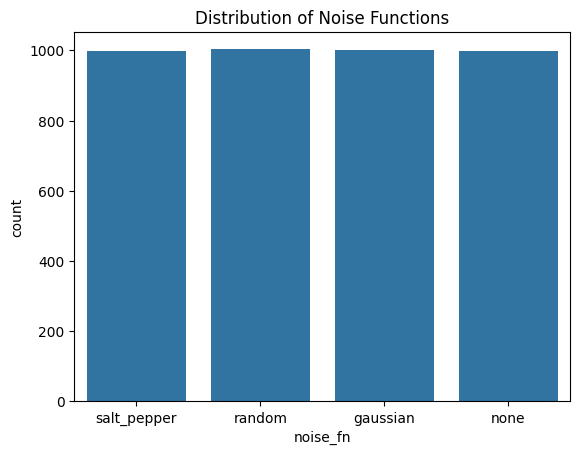

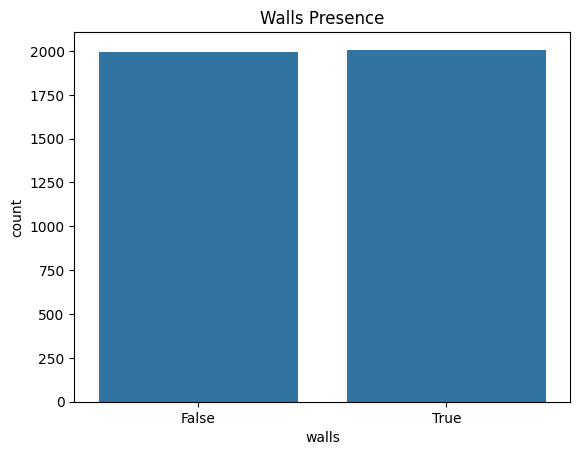

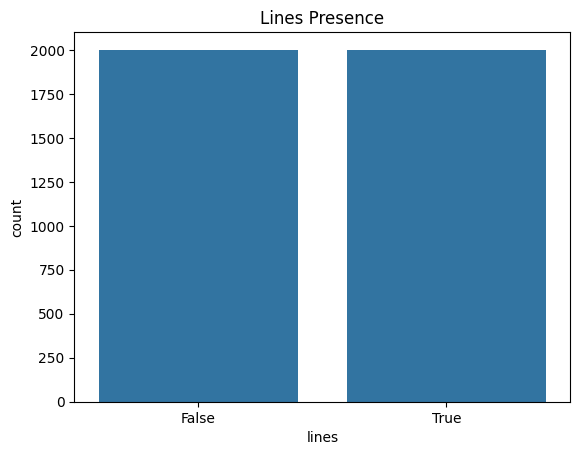

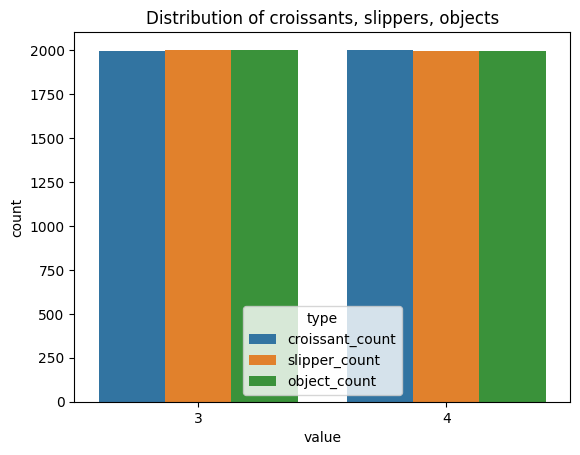

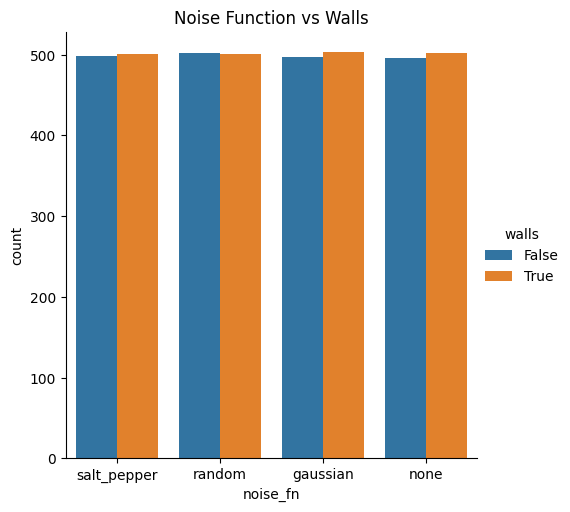

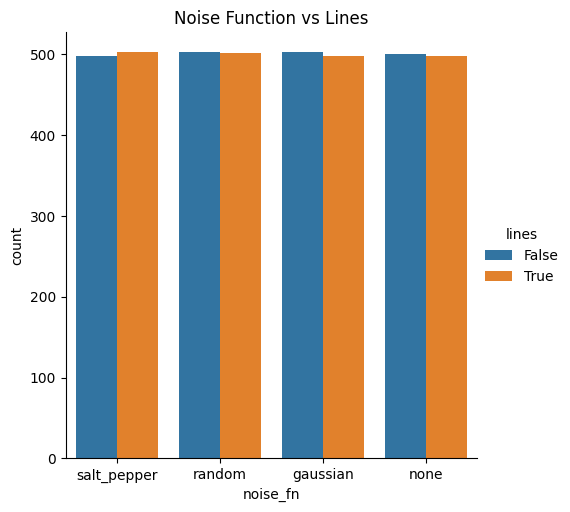

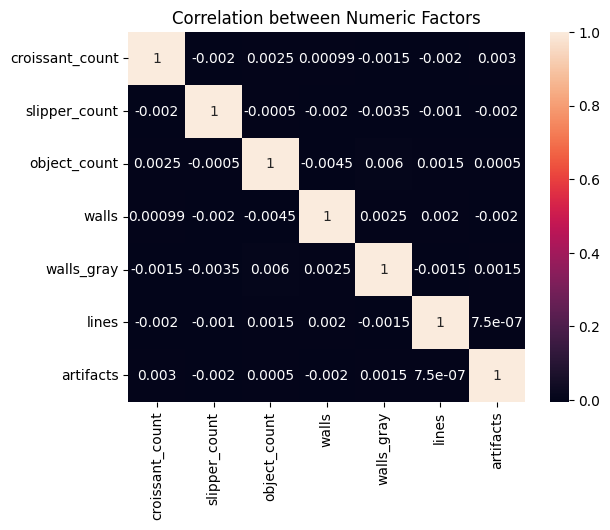



 test 


 ######## Noises ########## 
noise_fn
salt_pepper    501
random         501
gaussian       499
none           499
Name: count, dtype: int64

 ######## Walls ########## 
walls
True     1005
False     995
Name: count, dtype: int64

######## Elastic Lines ########## 
lines
False    1002
True      998
Name: count, dtype: int64


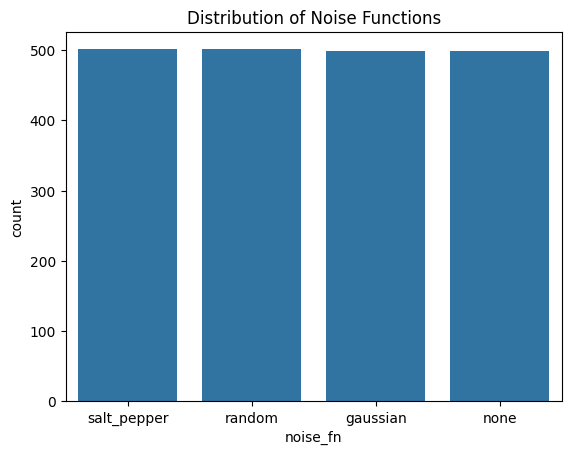

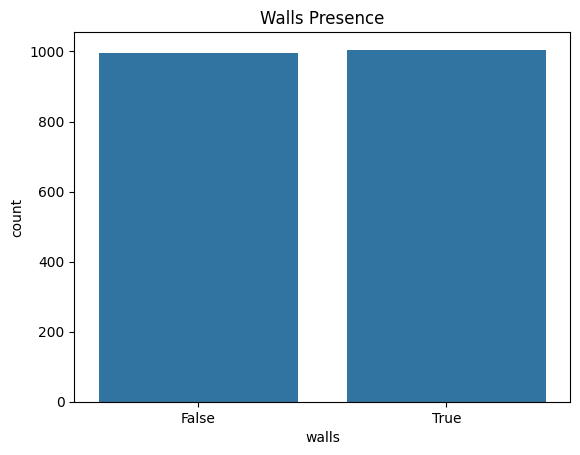

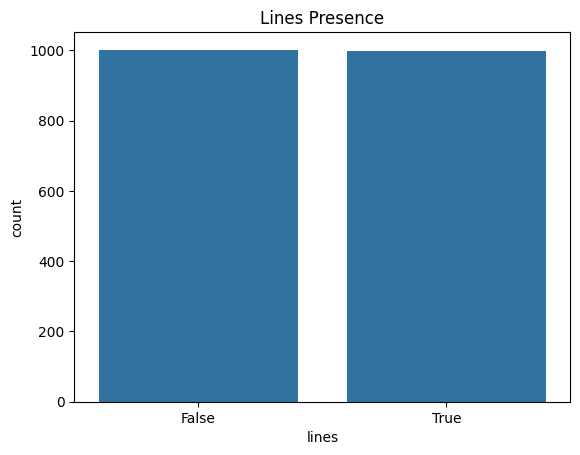

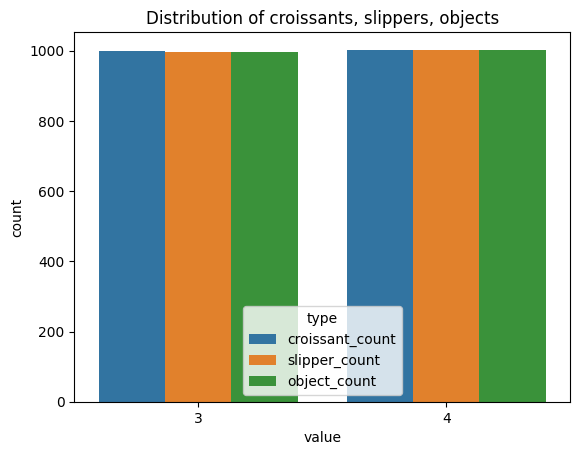

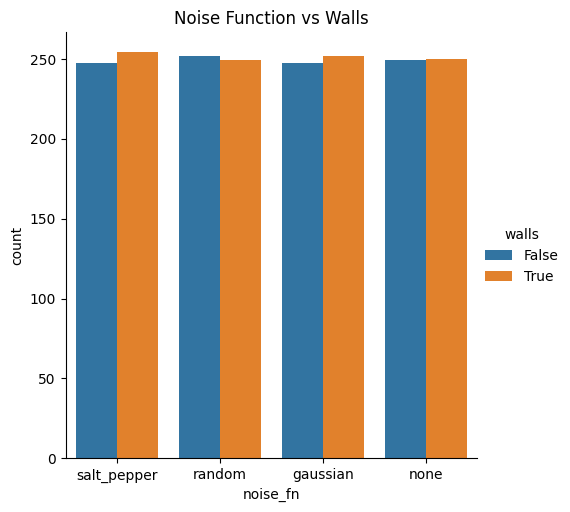

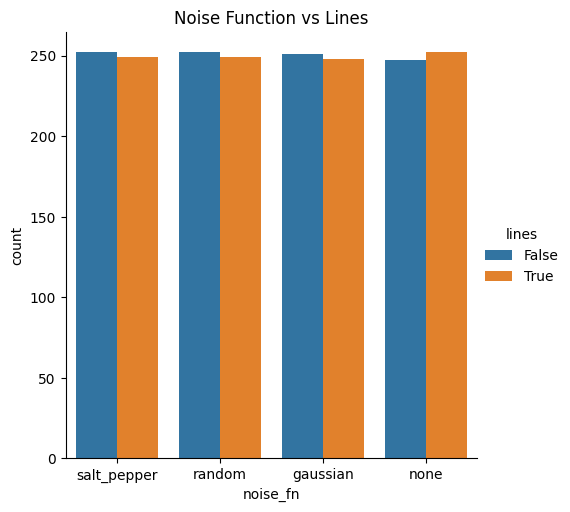

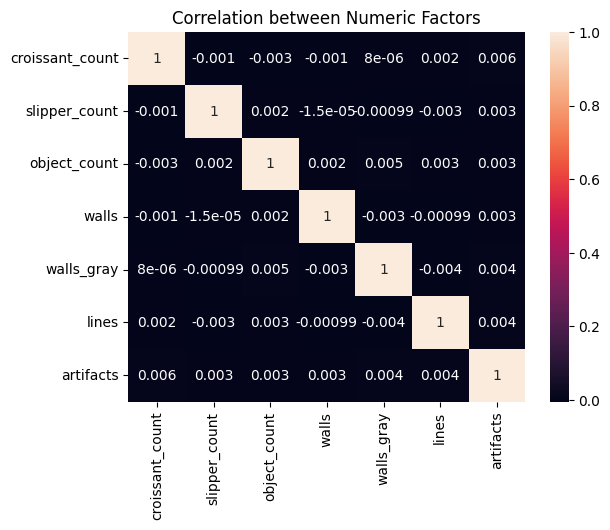



 val 


 ######## Noises ########## 
noise_fn
salt_pepper    503
random         501
gaussian       498
none           498
Name: count, dtype: int64

 ######## Walls ########## 
walls
False    1004
True      996
Name: count, dtype: int64

######## Elastic Lines ########## 
lines
True     1003
False     997
Name: count, dtype: int64


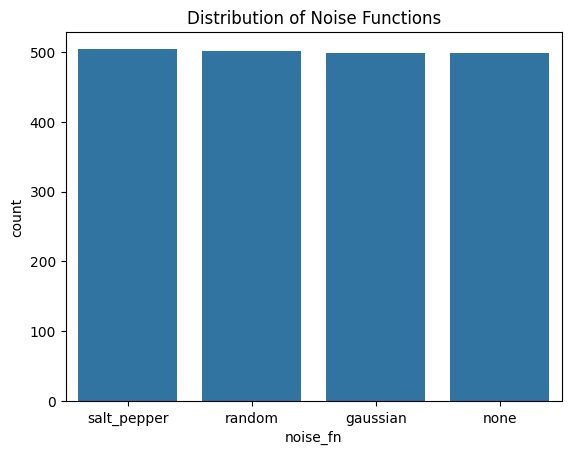

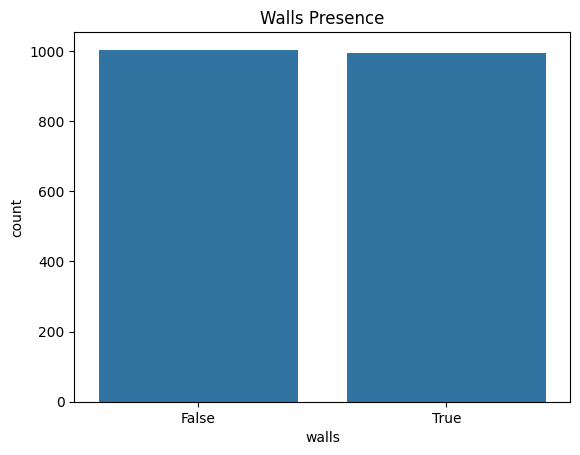

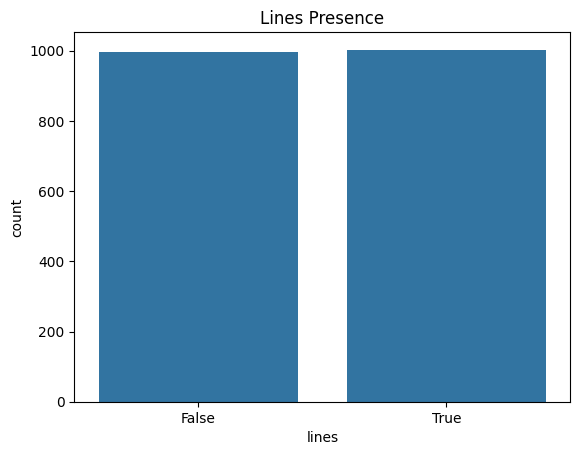

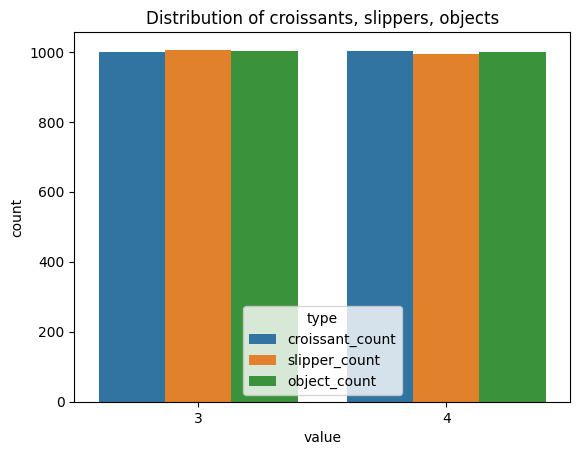

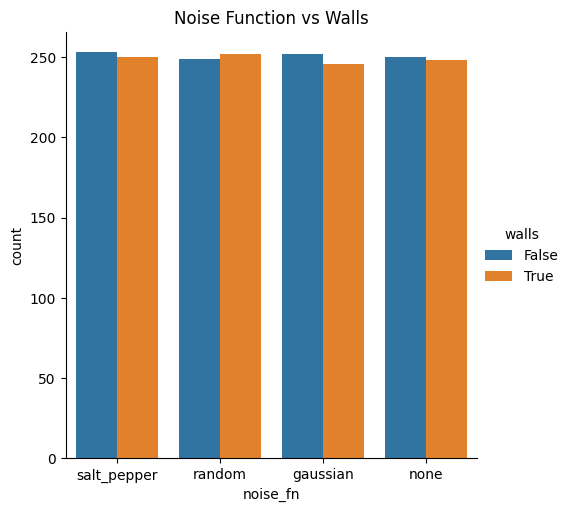

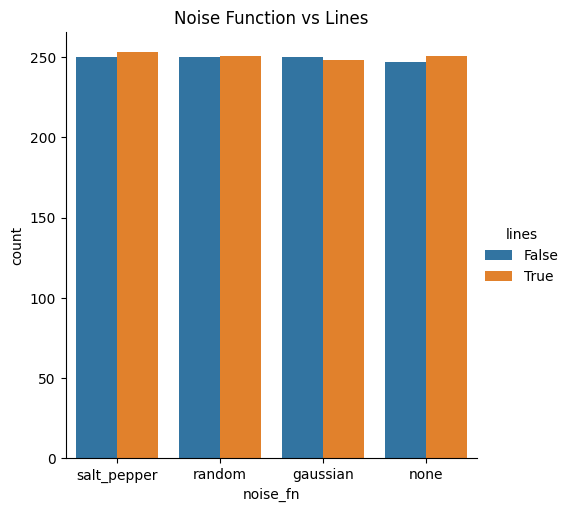

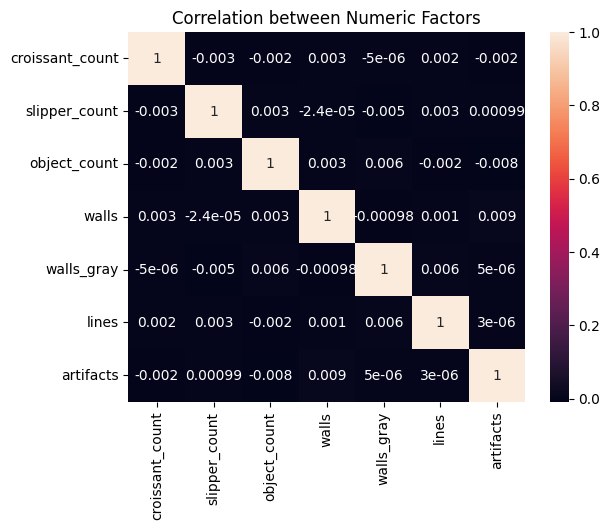

In [61]:
import pandas as pd
import seaborn as sns


for plan, split in zip(plans, ['train', 'test', 'val']):
    print('\n\n', split, '\n\n')
    df = pd.DataFrame(plan)
    
    print(' ######## Noises ########## ')
    print(df['noise_fn'].value_counts())
    print('\n ######## Walls ########## ')
    print(df['walls'].value_counts())
    print('\n######## Elastic Lines ########## ')
    print(df['lines'].value_counts())
    
    # Noise function distribution
    sns.countplot(x="noise_fn", data=df)
    plt.title("Distribution of Noise Functions")
    plt.show()
    
    # Walls / Lines
    sns.countplot(x="walls", data=df)
    plt.title("Walls Presence")
    plt.show()
    
    sns.countplot(x="lines", data=df)
    plt.title("Lines Presence")
    plt.show()
    
    
    df_long = df.melt(value_vars=["croissant_count", "slipper_count", "object_count"], 
                      var_name="type", value_name="value")
    sns.countplot(x="value", hue="type", data=df_long)
    plt.title("Distribution of croissants, slippers, objects")
    plt.show()
    
    # Cross-tabulation
    pd.crosstab(df['walls'], df['noise_fn'])
    pd.crosstab(df['lines'], df['noise_fn'])
    
    # Or, if you want fancier visual:
    sns.catplot(x="noise_fn", hue="walls", kind="count", data=df)
    plt.title("Noise Function vs Walls")
    plt.show()
    
    sns.catplot(x="noise_fn", hue="lines", kind="count", data=df)
    plt.title("Noise Function vs Lines")
    plt.show()
    
    sns.heatmap(df.corr(numeric_only=True), annot=True)
    plt.title("Correlation between Numeric Factors")
    plt.show()



### Visual check of generated dataset

Looking into /home/alex/dev/python/tx_rbc/tx_shared/data/cut_and_paste_2walls/train/images
Below image is 3861.png
(200, 200, 3)


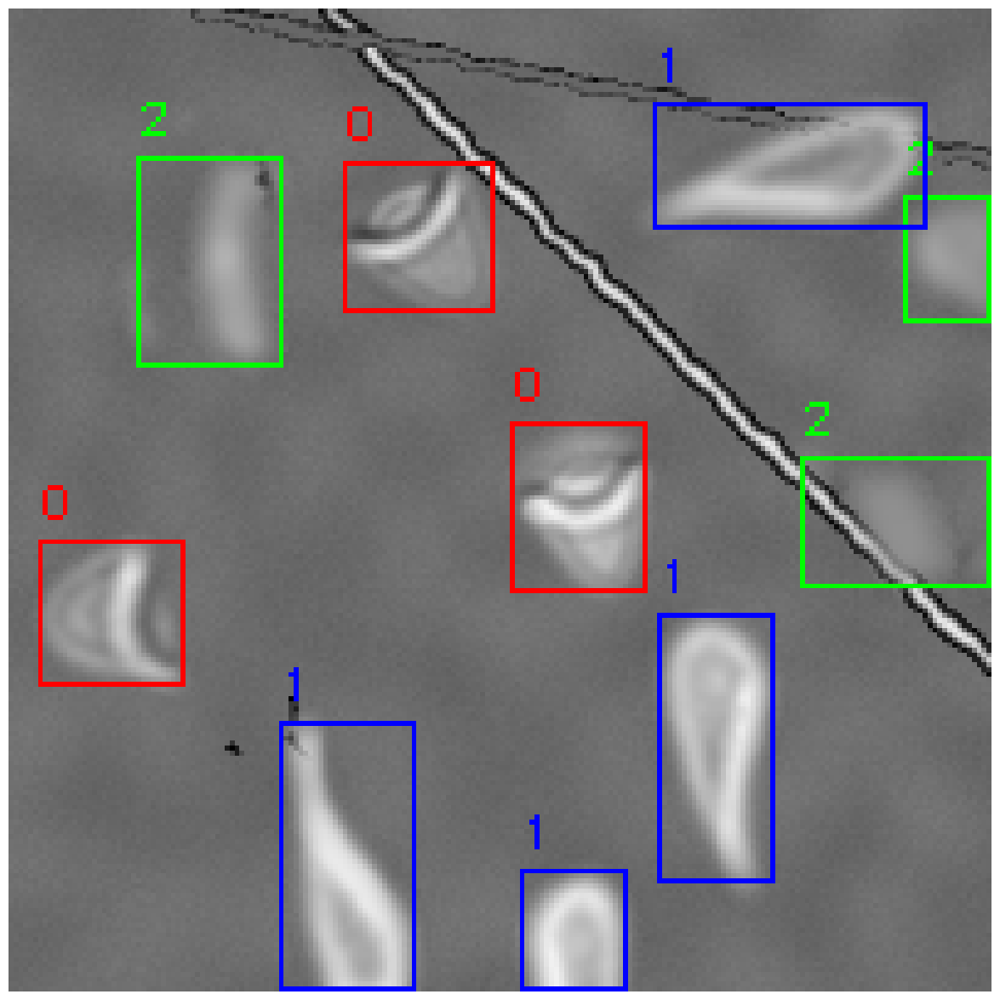

Below image is 3899.png
(200, 200, 3)


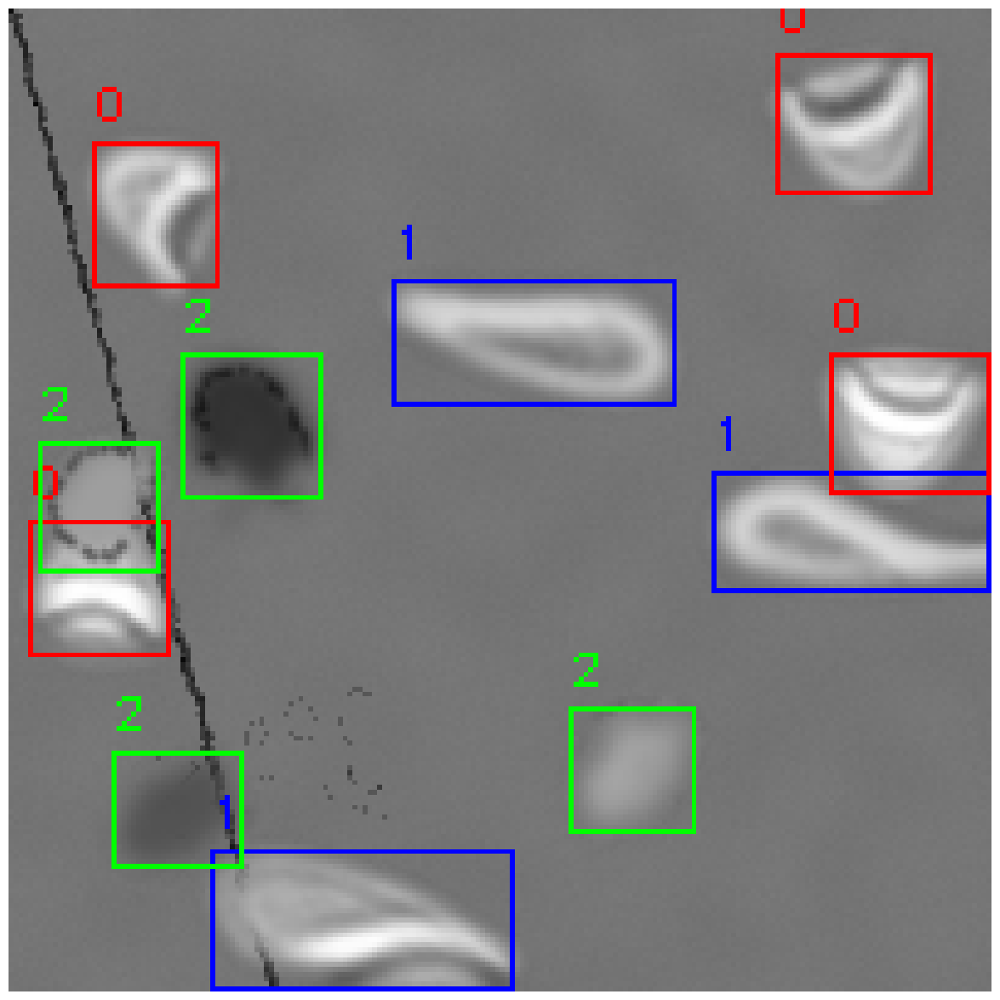

Below image is 3953.png
(200, 200, 3)


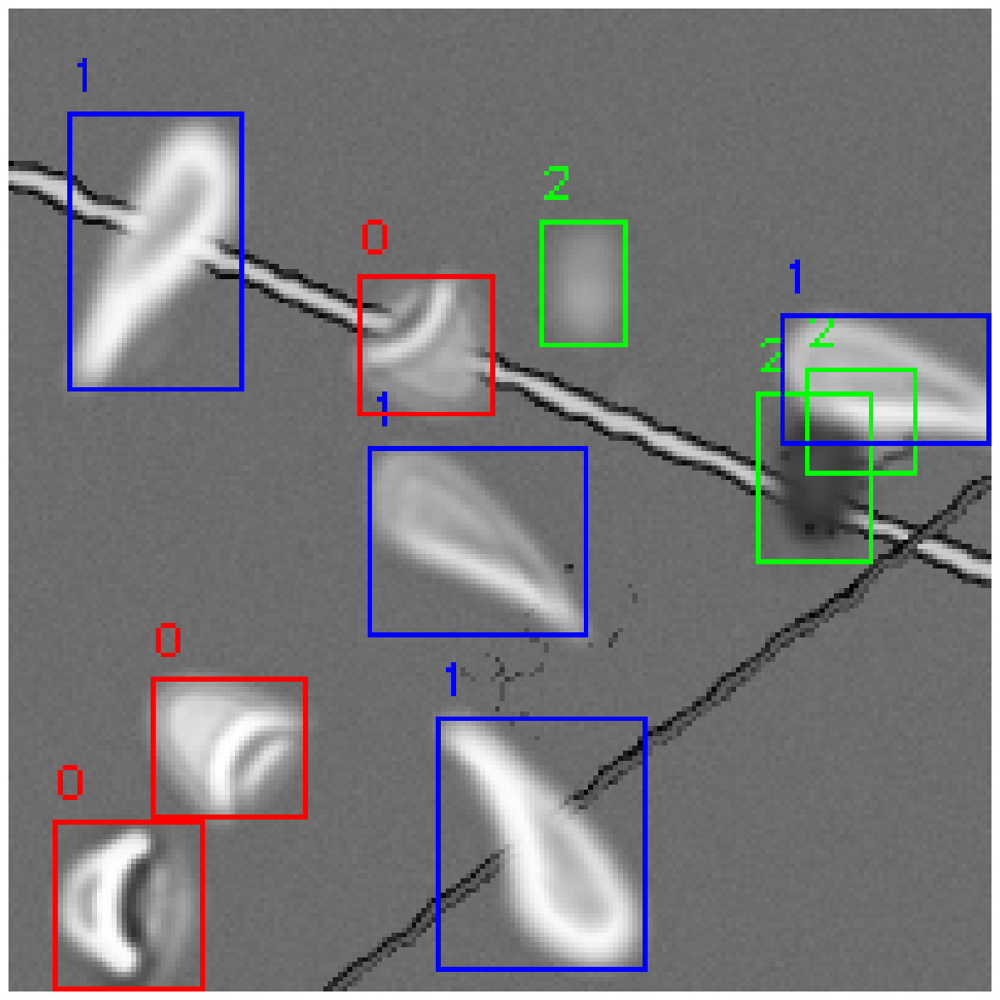

In [20]:
def draw_yolo_bboxes(root_path, N=5):
    images_path = os.path.join(root_path, "images")
    labels_path = os.path.join(root_path, "labels")

    image_files = sorted([f for f in os.listdir(images_path) if f.endswith(('.png', '.jpg', '.jpeg'))])
    print('Looking into', os.path.join(os.path.expanduser(root_path), "images"))
    
    #random.shuffle(image_files)

    for img_file in ['3861.png', '3899.png','3953.png']:#random.sample(image_files, N):
        print('Below image is', img_file)
        img_path = os.path.join(images_path, img_file)
        label_path = os.path.join(labels_path, os.path.splitext(img_file)[0] + ".txt")

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for Matplotlib
        print(image.shape)
        h, w, c = image.shape

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    data = line.strip().split()
                    class_id = int(data[0])
                    x_center, y_center, width, height = map(float, data[1:])

                    # Convert YOLO format to pixel coordinates
                    x1 = int((x_center - width / 2)*w )
                    y1 = int((y_center - height / 2)*h )
                    x2 = int((x_center + width / 2)*w )
                    y2 = int((y_center + height / 2)*h )

                    # debug bbox
                    #print(x_center, y_center, width, height, '=>', x1, x2, y1, y2)

                    # Draw bounding box
                    if class_id == 0:
                        color = (255, 0, 0)  # Red color
                    elif class_id == 1:
                        color = (0, 0, 255)  # Blue color
                    elif class_id == 2:
                        color = (0, 255, 0)  # Green color
                    cv2.rectangle(image, (x1, y1), (x2, y2), color, 1)
                    cv2.putText(image, str(class_id), (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, color, 1)
        else:
            raise ValueError(f'The image {img_file} does not have labels: {label_path} does not exists')

        plt.figure(figsize=(15, 15))
        plt.imshow(image, cmap='gray', vmin=0, vmax=255)
        plt.axis("off")
        plt.savefig("/home/alex/dev/python/tx_rbc/tx_shared/media/demo_images/conf/final" + img_file)
        plt.show()

draw_yolo_bboxes("/home/alex/dev/python/tx_rbc/tx_shared/data/cut_and_paste_2walls/train", N=30)

### Zip the dataset

To better load in Colabshutil.make_archive('synthetic_dataset', 'zip', PATH_SYNTHETIC)

In [107]:
shutil.make_archive('dataset_copy_paste', 'zip', dataset_path)

'/home/alex/dev/python/tx_rbc/tx_shared/notebooks/dataset_copy_paste.zip'

# DEMO for CONF


## Background creation

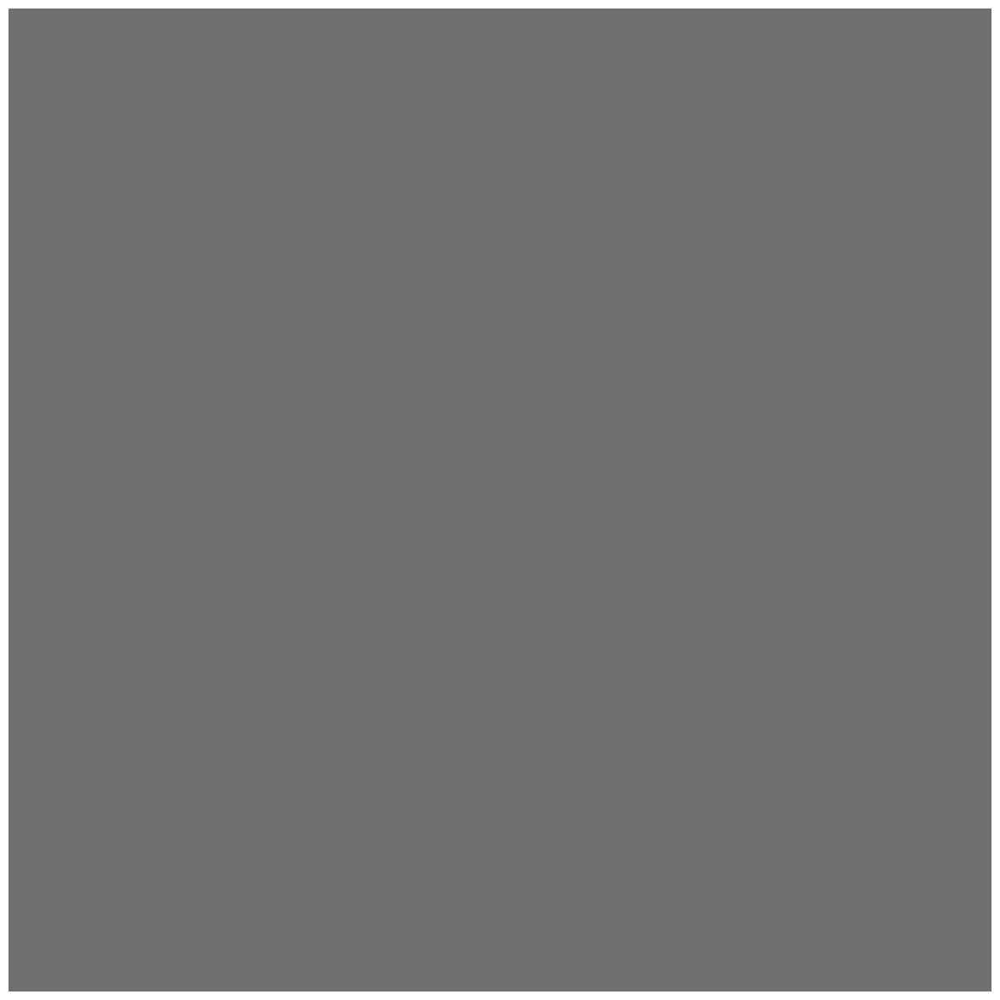

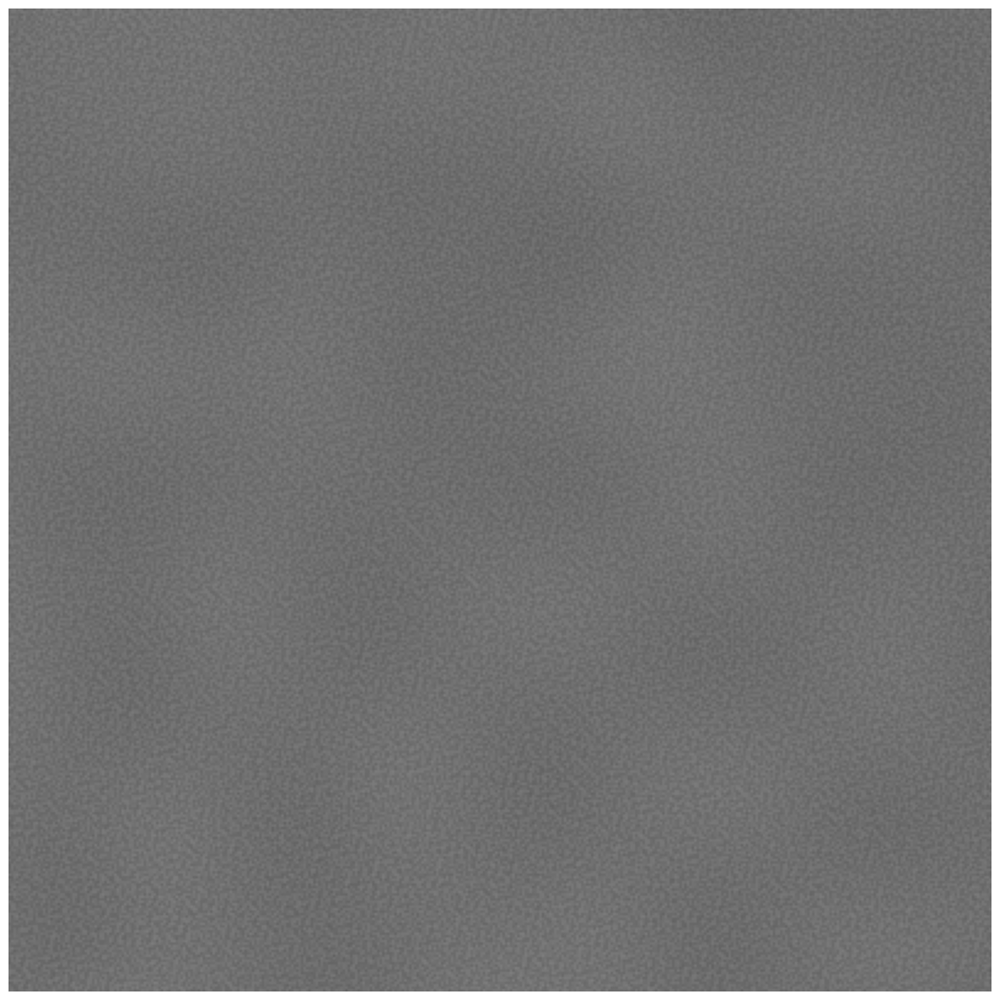

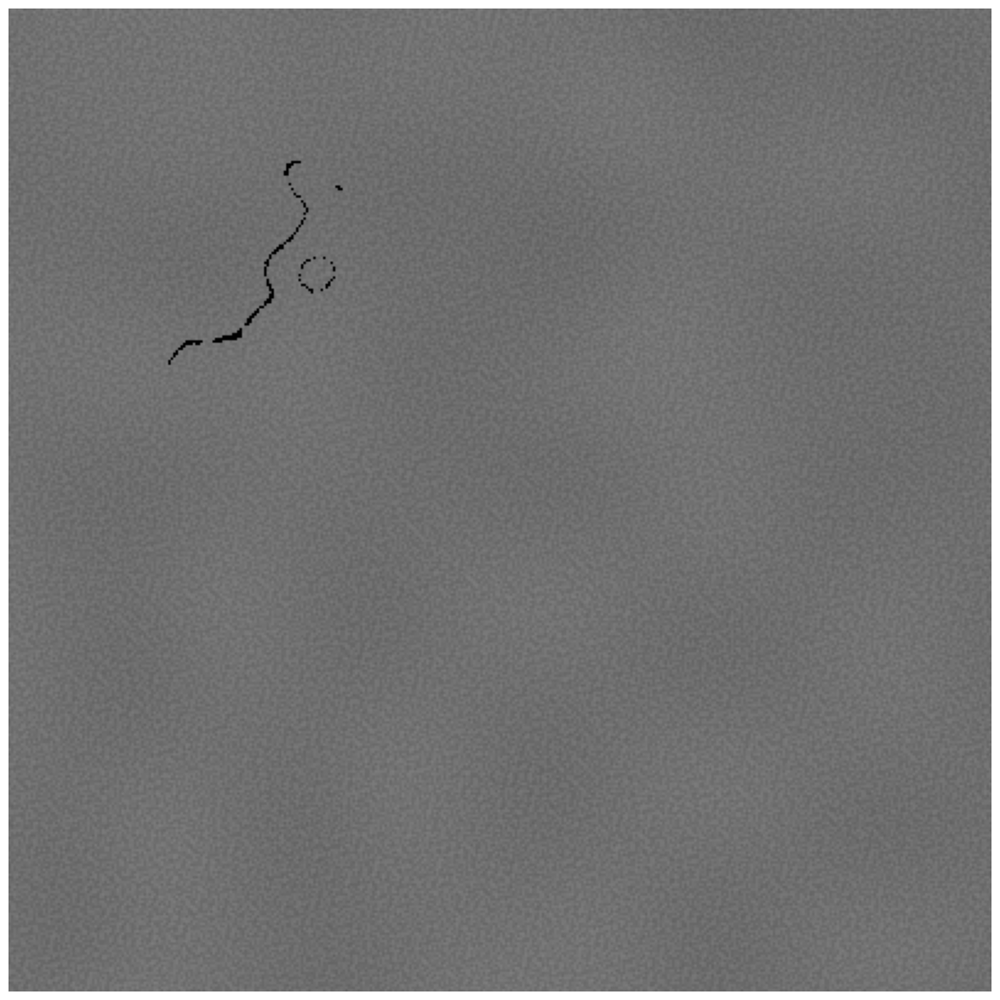

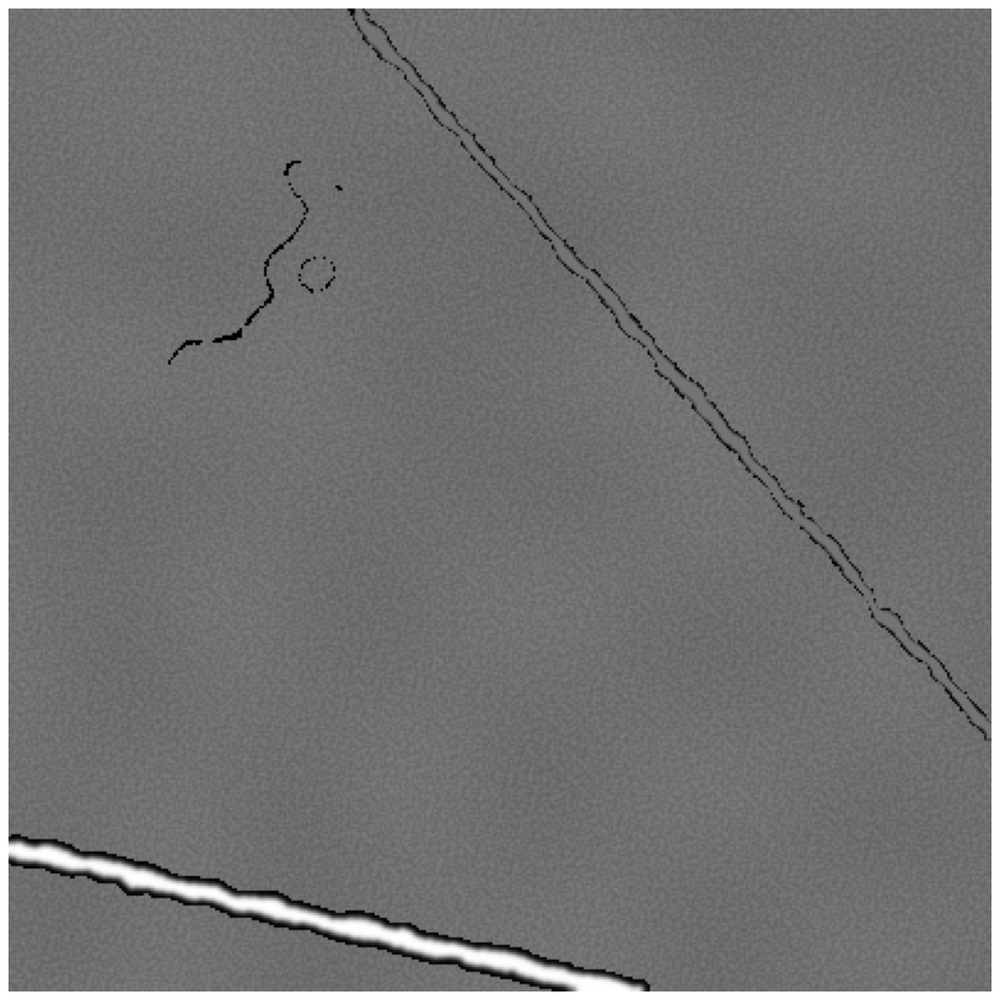

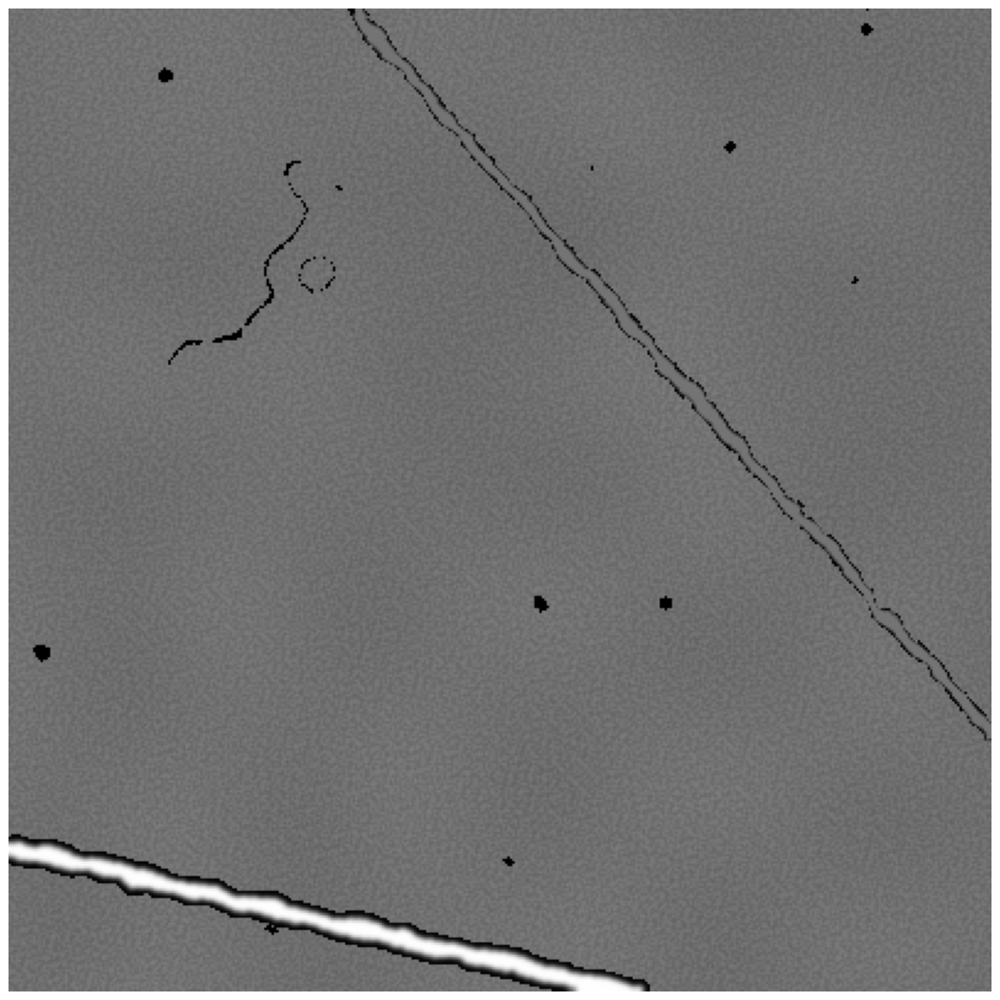

In [72]:
plt.figure(figsize=(15, 15))#40, 20))


height, width=400, 400
# Step 1: Random base background color
base_color = random.randint(100, 150)
base_image = np.full((height, width), base_color, dtype=np.float32)

#plt.subplot(151)
plt.axis('off')
plt.imshow(base_image, cmap='gray', vmin=0, vmax=255)
plt.savefig('/home/alex/dev/python/tx_rbc/tx_shared/media/demo_images/conf/bg_1_color.png')


# Step 2: Add first Simplex noise with random zoom level
zoom1 = random.uniform(0.5, 2.0)
noise1 = np.array([[snoise2(x / zoom1, y / zoom1) for x in range(width)] for y in range(height)])
noise1 = (noise1 - noise1.min()) / (noise1.max() - noise1.min())  # Normalize to (0,1)
base_image += noise1 * random.uniform(0.5, 2.0)

# Step 3: Apply Gaussian blur with a random radius
img =PIL_Image_fromarray(np.uint8(base_image))
blur_radius = random.uniform(1.0, 3.0)
img = img.filter(PIL_ImageFilter_GaussianBlur(radius=blur_radius))

# Step 4: Add second Simplex noise with randomized intensity
zoom2 = random.uniform(0.5, 3.0)
noise2 = np.array([[snoise2(x / zoom2, y / zoom2) for x in range(width)] for y in range(height)])
noise2 = noise2 * random.uniform(-20, 20)  # Random scale range
img_array = np.array(img, dtype=np.float32) + noise2

# Step 5: Add third Simplex noise with a different zoom and intensity
zoom3 = random.uniform(0.005, 0.02)
noise3 = np.array([[snoise2(x * zoom3, y * zoom3) for x in range(width)] for y in range(height)])
noise3 = noise3 * random.uniform(-10, 10)
img_array += noise3

# Clip and convert back to image
img_array = np.clip(img_array, 0, 255).astype(np.uint8)
final_image = img_array#PIL_Image_fromarray(img_array)


#plt.subplot(152)
plt.figure(figsize=(15, 15))
plt.imshow(final_image, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.savefig('/home/alex/dev/python/tx_rbc/tx_shared/media/demo_images/conf/bg_2_noise.png')

img = add_elastic_line(final_image)
plt.figure(figsize=(15, 15))
#plt.subplot(153)
plt.imshow(img, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.savefig('/home/alex/dev/python/tx_rbc/tx_shared/media/demo_images/conf/bg_3_thin_hair.png')

img = add_walls(img)
img = add_walls_gray(img)
plt.figure(figsize=(15, 15))
#plt.subplot(154)
plt.imshow(img, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.savefig('/home/alex/dev/python/tx_rbc/tx_shared/media/demo_images/conf/bg_4_walls.png')


img = add_cell_artifacts_to_background(img, 10)
plt.figure(figsize=(15, 15))
#plt.subplot(155)
plt.imshow(img, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.savefig('/home/alex/dev/python/tx_rbc/tx_shared/media/demo_images/conf/bg_5_artifacts.png')

#plt.tight_layout()
#plt.savefig('step_by_step_background.png')
#plt.show()

In [74]:
IMG_DEMO = img

## Add cells to it



=== Nouman ===
0    76
1    81
dtype: int64

nan count:
 0    5
1    0
dtype: int64


=== Liang ===
0    587
1    189
dtype: int64

nan count:
 0      0
1    398
dtype: int64


=== Kihm ===
0    2492
1    2992
dtype: int64

nan count:
 0    500
1      0
dtype: int64


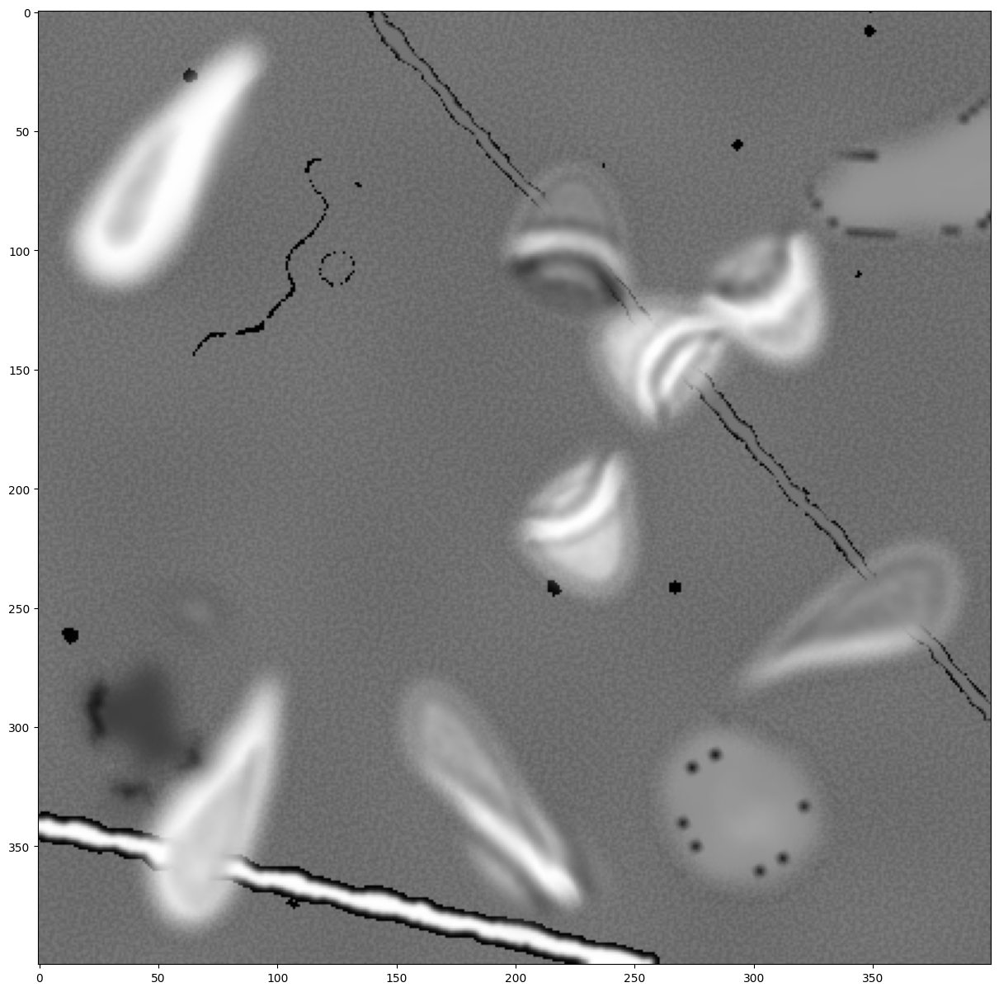

In [76]:
global_ds = load_dataset_with_splits()
global_ds_train, global_ds_test, global_ds_val = global_ds['train'], global_ds['test'], global_ds['val']
ds = global_ds_train

IMG_DEMO_CELLS = IMG_DEMO.copy()

base_bg_color = 102

nb_objects = 3
nb_croissants = 4
nb_slippers = 4

croissants = random.sample(ds['0'], nb_croissants)
slippers = random.sample(ds['1'], nb_slippers)

# Create image of objects (non croissants nor slippers)
objects = []
for o_index in range(nb_objects):
    cell, mask = generate_cell_image(
          47, 47, 10, 8, 7
      )
    cell = np.where(mask, cell, 0)
    objects.append((cell, mask))

# Create a list of (cell, label) tuples, shuffle it and retrieve cells and labels
labeled_cells = [(c, '0') for c in croissants] +\
                [(s, '1') for s in slippers] + \
                [(o, '2') for o in objects]

random.shuffle(labeled_cells) # Shuffle the list of tuples so that all cells may appear on top
cells_at_index = [item[0] for item in labeled_cells] # Separate the shuffled cells and their labels
labels = [item[1] for item in labeled_cells]

# === 1. Overlay the above cells on the same background ===
bboxes = []
# At start, all pixels in the images are valid placements.
# (we remove the 50 bottom and right pixels to prevent cells from being only a few pixel visibile)
possible_placements = np.ones_like(IMG_DEMO_CELLS)
possible_placements[:, -50:] = 0
possible_placements[-50:, :] = 0


for idx, (label, (cell, mask)) in enumerate(zip(labels, cells_at_index)):
    h, w = cell.shape
    # Compute minimum scaling factor to preserve minimum size
    min_width, min_height = 80, 80
    min_scale_x = min_width / w
    min_scale_y = min_height / h
    min_scale = max(min_scale_x, min_scale_y)  # ensure both width and height are above threshold

    if label == '2':
        scale_factor = random.uniform(3, 4)
    else:    
        # Clamp scale_factor to stay within valid range
        scale_factor = random.uniform(0.75, 1.25)
    scale_factor = max(scale_factor, min_scale)

    # Change color of cell
    cell_recolored = change_color(cell, mask, 'nuance', background_base_color=base_bg_color)
    
    cell = cv2.resize(cell_recolored, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
    
    IMG_DEMO_CELLS, bbox = overlay_cell_on_background(cell, IMG_DEMO_CELLS,
                                             [(x, y) for y, x in list(zip(*np.where(possible_placements)))])
    # Note: the possible_placements is converted from a 2D binary mask to a list (x, y) of 
    # available positions.
    
    if not bbox is None:
        # remember how many pixels this cell covered originally:
        #orig_counts[idx] = ( int(bbox[2])-int(bbox[0]) )*( int(bbox[3])-int(bbox[1]) ) # pixel count
        #id_mask[int(bbox[1]): int(bbox[3]), int(bbox[0]):int(bbox[2])] = idx
        
        bboxes.append((label, bbox))

        # As a cell was placed, we prevent another cell from being place
        # on top, by removing, from the possible placements, the area covered
        # by the placed cell. We let the 
        possible_placements = zero_out_enlarged_bbox(possible_placements, bbox, enlarge_ratio=0.5)

            

# Add noise to image
# Noise functions take input as 0-1 and output 0-1
#IMG_DEMO_CELLS = noise_function(IMG_DEMO_CELLS.astype(np.float32)/255.0)*255.0

plt.figure(figsize=(15, 15))
plt.imshow(IMG_DEMO_CELLS, cmap='gray', vmin=0, vmax=255)
plt.show();

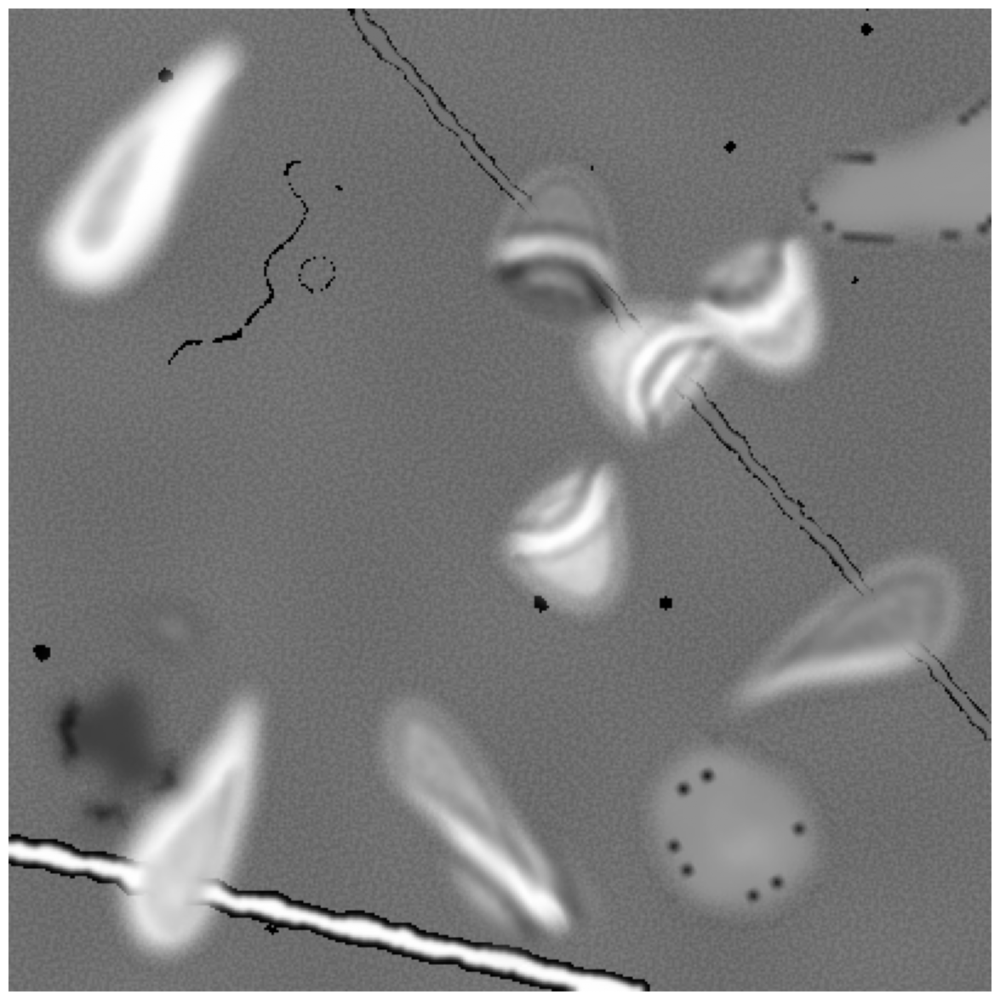

In [87]:
plt.figure(figsize=(15, 15))
plt.imshow(IMG_DEMO_CELLS, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.savefig("/home/alex/dev/python/tx_rbc/tx_shared/media/demo_images/conf/final.png")

## Plot bboxes

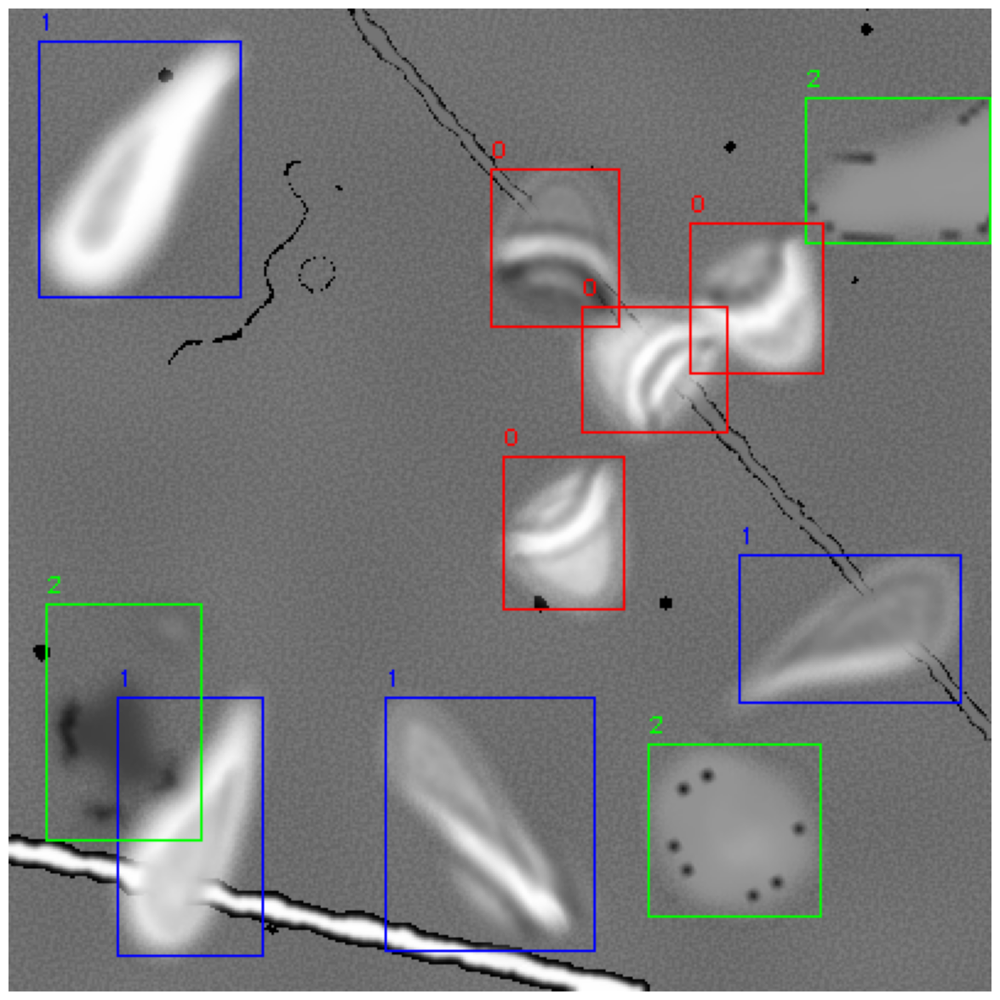

In [85]:
image = cv2.cvtColor(IMG_DEMO_CELLS.copy(), cv2.COLOR_GRAY2RGB)
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for Matplotlib
h, w, c = image.shape

for label, bbox in bboxes:
    class_id = int(label)
            
    #bbox = (  # Scale the bbox to final image size:
    #    int(bbox[0]*scale_x), int(bbox[1]*scale_y),
    #    int(bbox[2]*scale_x), int(bbox[3]*scale_y))
    
    bbox_yolo = fullsize_bbox_to_yolo_bbox(bbox, 
                                           image_width=image.shape[1], 
                                           image_height=image.shape[0])
    
    x_center, y_center, width, height = bbox_yolo

    # Convert YOLO format to pixel coordinates
    x1 = int((x_center - width / 2)*w )
    y1 = int((y_center - height / 2)*h )
    x2 = int((x_center + width / 2)*w )
    y2 = int((y_center + height / 2)*h )

    # Draw bounding box
    if class_id == 0:
        color = (255, 0, 0)  # Red color
    elif class_id == 1:
        color = (0, 0, 255)  # Blue color
    elif class_id == 2:
        color = (0, 255, 0)  # Green color
    cv2.rectangle(image, (x1, y1), (x2, y2), color, 1)
    cv2.putText(image, str(class_id), (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, color, 1)

plt.figure(figsize=(15, 15))
plt.imshow(image, cmap='gray', vmin=0, vmax=255)
plt.axis("off")
plt.savefig("/home/alex/dev/python/tx_rbc/tx_shared/media/demo_images/conf/final_bboxes.png")
plt.show()